# <font color='purple'>Preprocessing QC statistics </font> 
### October 2024

In [2]:
import os
NOVA_HOME = '/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA'
NOVA_DATA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps'
LOGS_PATH = os.path.join(NOVA_HOME, 'logs', 'neurons')
PLOT_PATH = os.path.join(NOVA_HOME, 'src', 'preprocessing', 'notebooks','figures','Neurons_80pct')
os.chdir(NOVA_HOME)
import pandas as pd
import contextlib
import io
from IPython.display import display, Javascript

from tools.preprocessing_tools.qc_reports.qc_utils import log_files_qc, run_validate_folder_structure, display_diff, sample_and_calc_variance, \
                                                show_site_survival_dapi_brenner, show_site_survival_dapi_cellpose, \
                                                show_site_survival_dapi_tiling, show_site_survival_target_brenner, \
                                                calc_total_sums, plot_filtering_heatmap, show_total_sum_tables, \
                                                plot_cell_count, plot_catplot, plot_hm_combine_batches, plot_hm, \
                                                run_calc_hist_new
                                                
from tools.preprocessing_tools.qc_reports.qc_config import panels, markers, marker_info, cell_lines, cell_lines_to_cond,\
                                    cell_lines_for_disp, reps, line_colors, lines_order, custom_palette,\
                                    expected_dapi_raw
%load_ext autoreload
%autoreload 2

In [6]:
# choose batches
batches = [f'batch{i}_80pct' for i in range(4,10)]

In [7]:
df = log_files_qc(LOGS_PATH, batches)

df_dapi = df[df.marker=='DAPI']
df_target = df[df.marker!='DAPI']

reading logs of batch7_80pct
reading logs of batch6_80pct
reading logs of batch4_80pct
reading logs of batch5_80pct
reading logs of batch8_80pct
reading logs of batch9_80pct

Total of 6 files were read.
Before dup handeling  (342775, 21)
After duplication removal #1: (342775, 22)
After duplication removal #2: (342775, 22)


## Actual Files Validation

### Raw Files Validation

1. How many site **tiff** files do we have in each folder?
2. Are all existing files valid? (tif, at least 2049kB, not corrupetd)

batch4
Folder structure is valid.
No bad files are found.
Total Sites:  64800


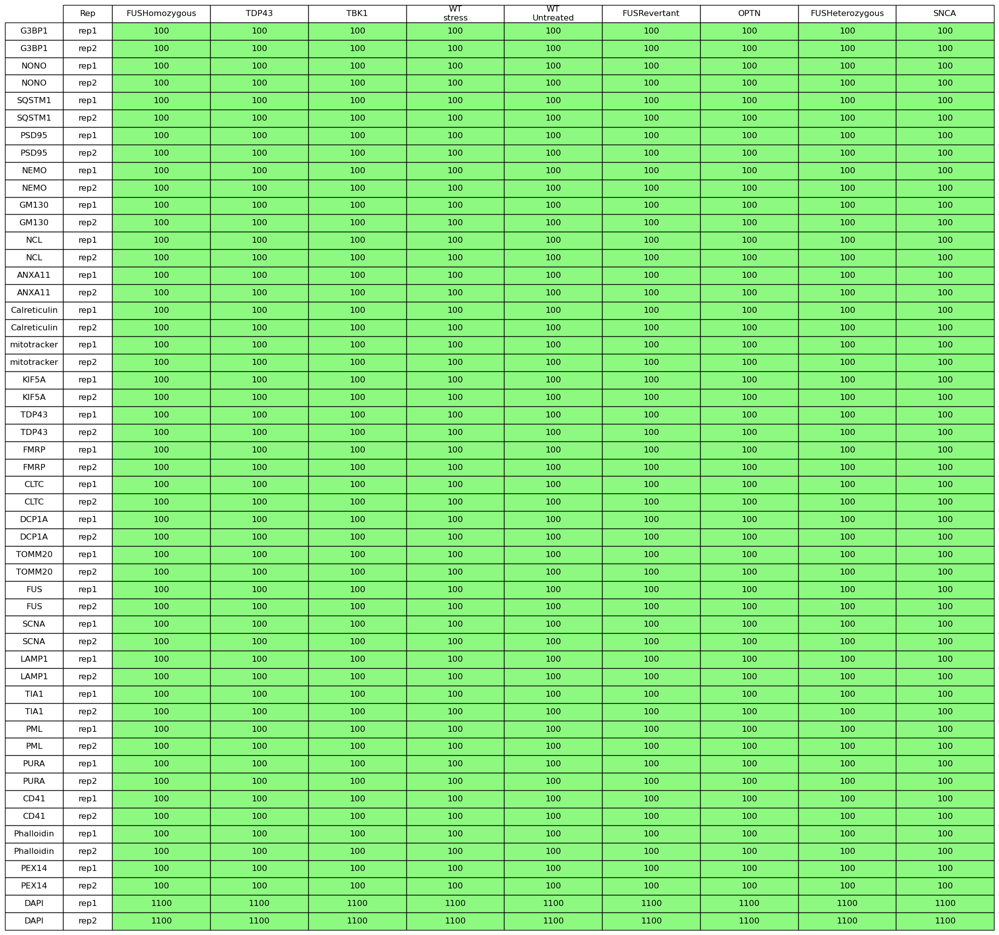

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  64800


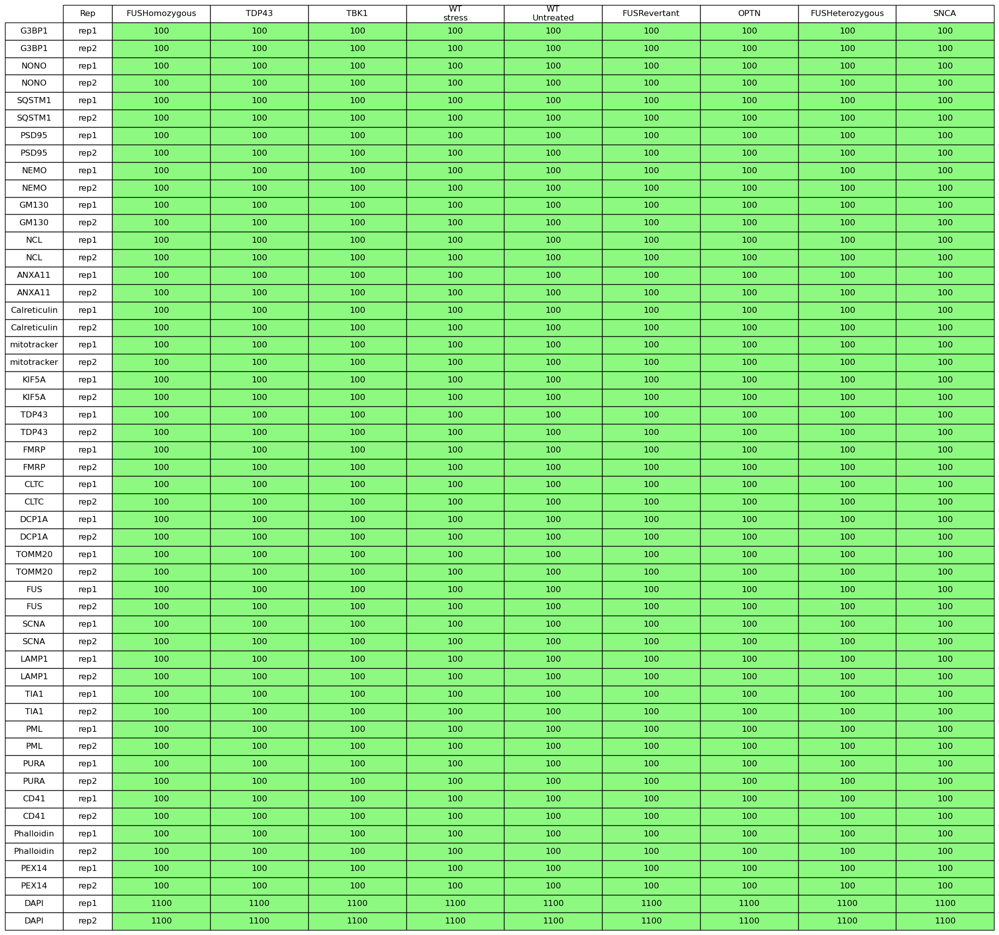

batch6
Folder structure is valid.
No bad files are found.
Total Sites:  64800


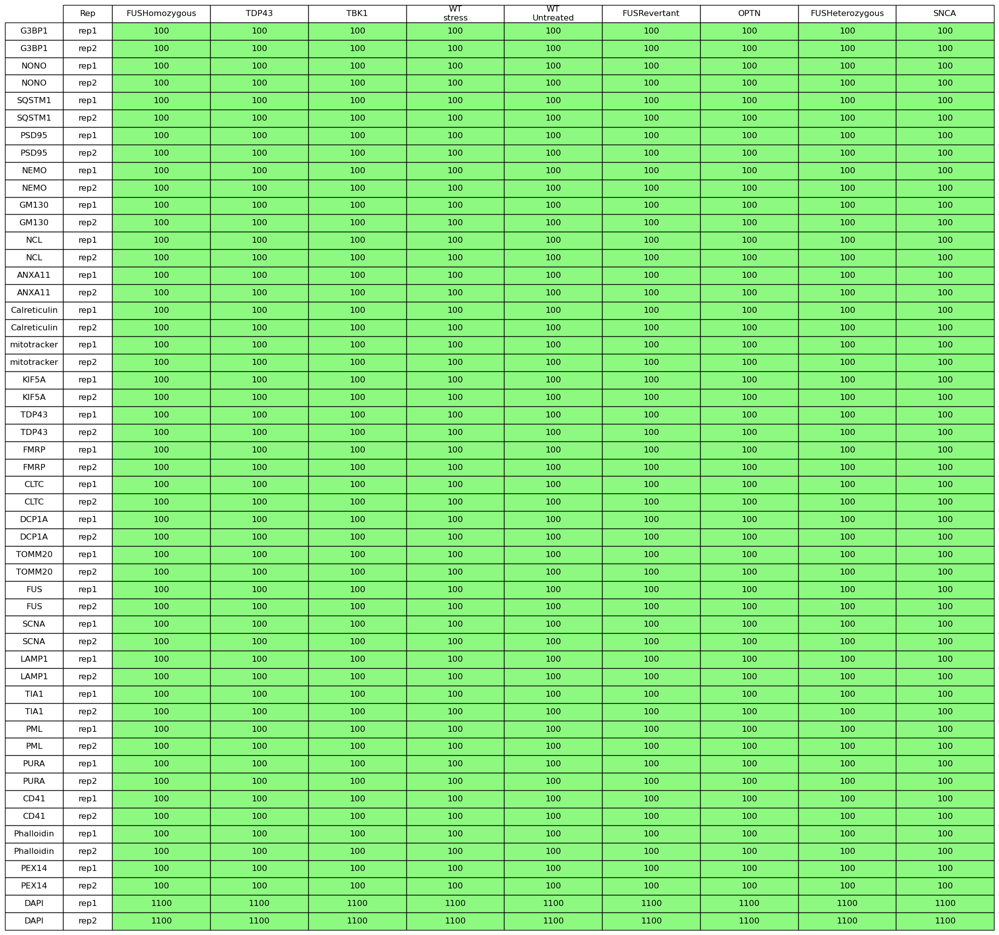

batch7
Folder structure is valid.
No bad files are found.
Total Sites:  64800


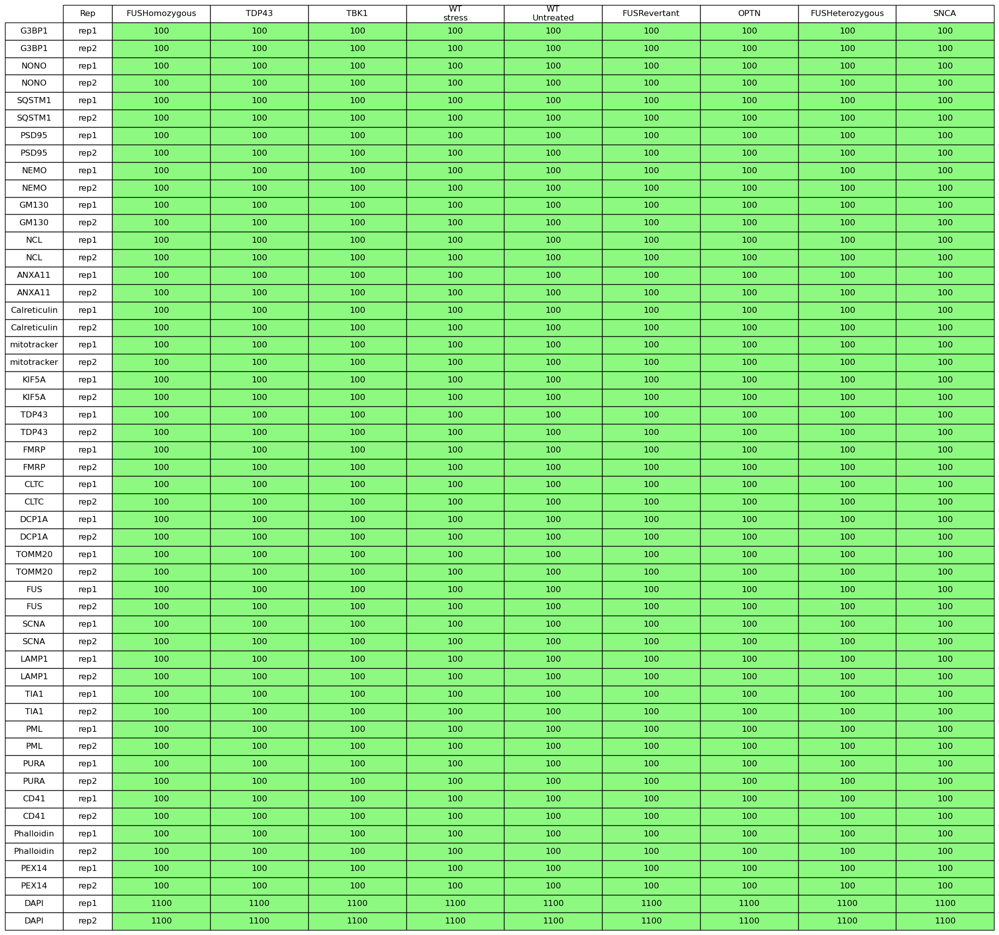

batch8
Folder structure is valid.
No bad files are found.
Total Sites:  64800


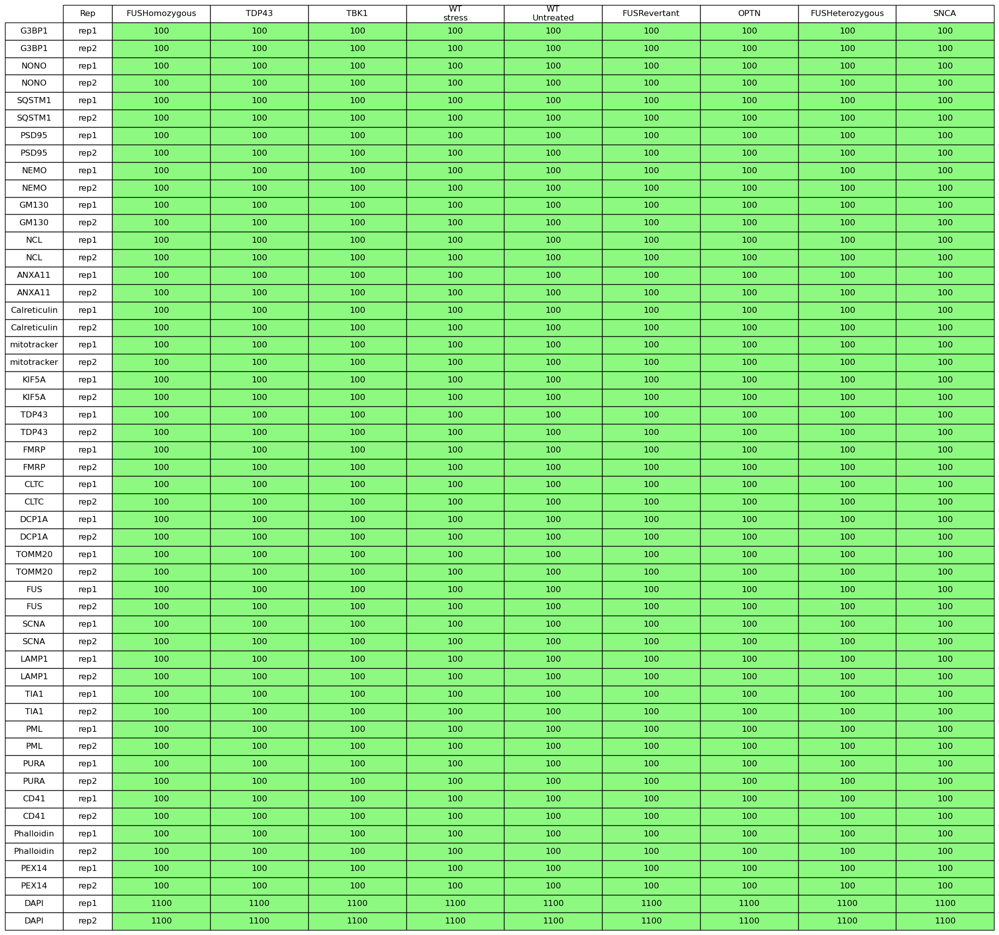

batch9
Folder structure is valid.
No bad files are found.
Total Sites:  64800


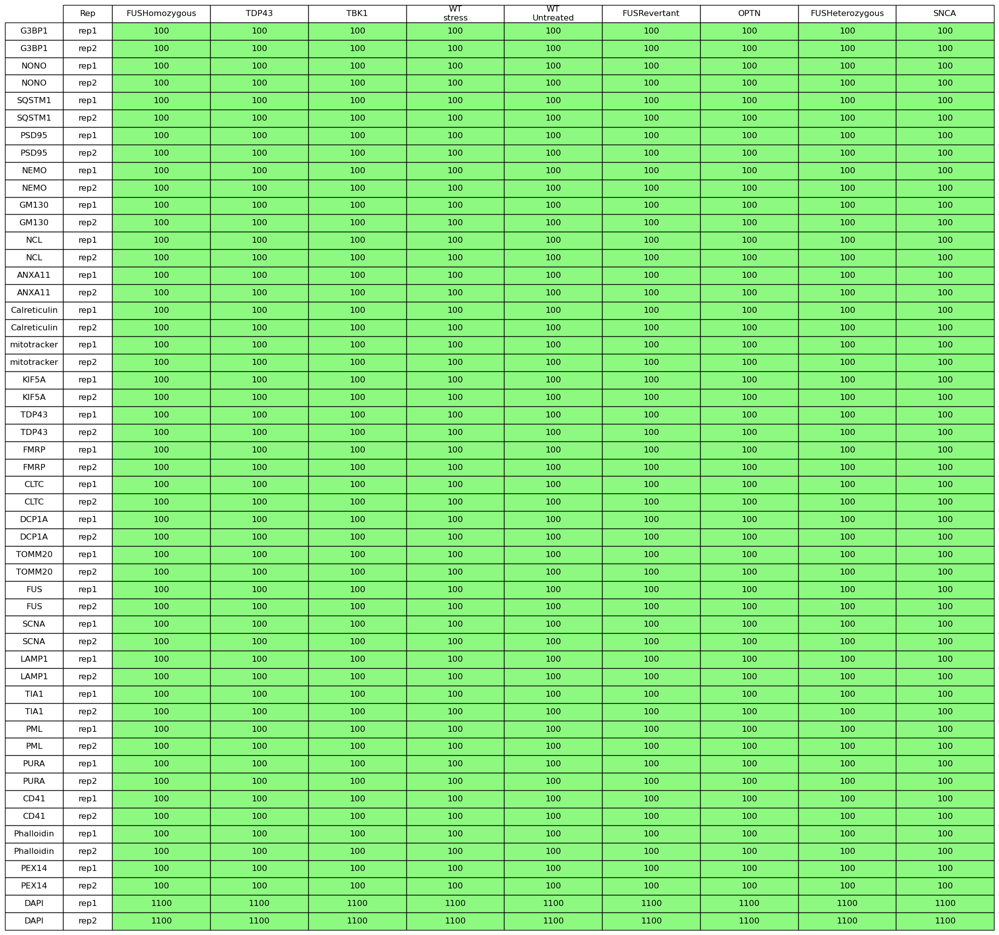

In [8]:

root_directory_raw = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'raw', 'SpinningDisk')

batches_raw = [batch.replace("_80pct","") for batch in batches]
raws = run_validate_folder_structure(root_directory_raw, False, panels, markers,PLOT_PATH,marker_info,
                                    cell_lines_to_cond, reps, cell_lines_for_disp, expected_dapi_raw,
                                     batches=batches_raw)

### Processed Files Validation

1. How many site **npy** files do we have in each folder? -> How many sites survived the pre-processing?
2. Are all existing files valid? (at least 100kB, npy not corrupted)

batch480pct
Folder structure is invalid. Missing 13 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/FUSHomozygous/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/TDP43/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/TBK1/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/WT/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/WT/stress/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/FUSRevertant/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/OPTN/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch480pct/FUSHet

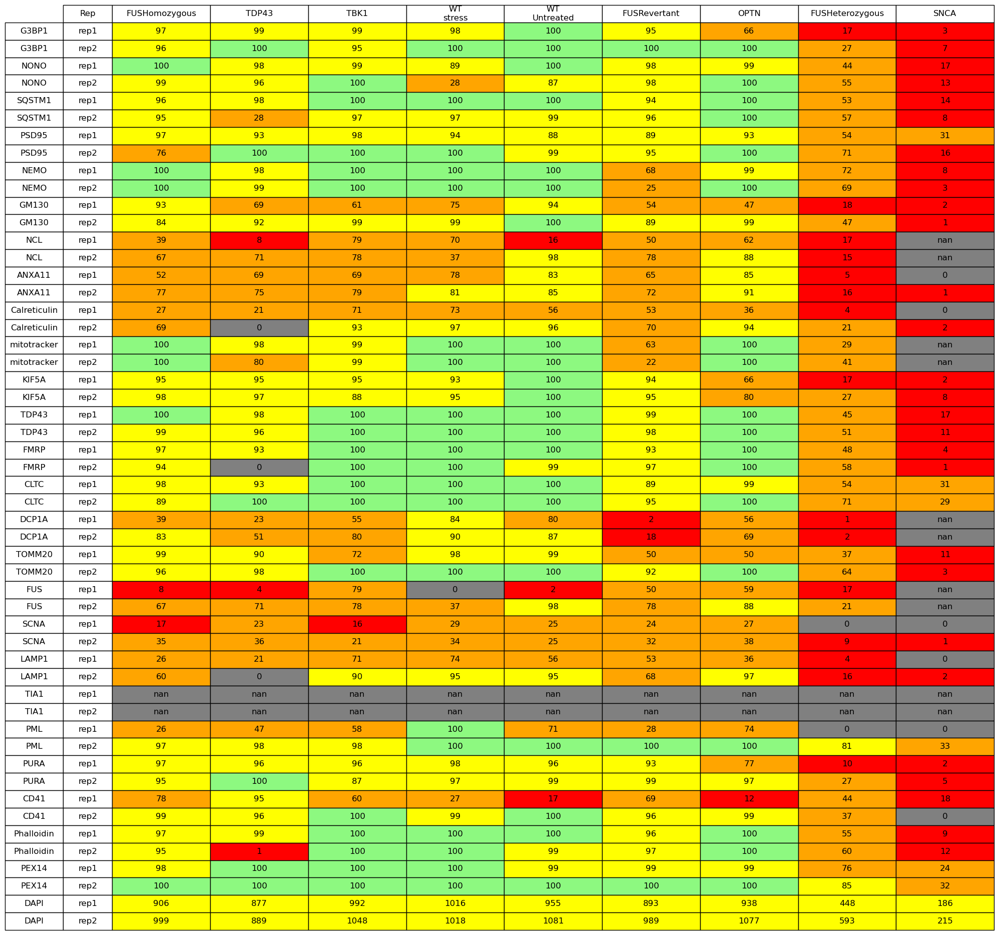

batch580pct
Folder structure is invalid. Missing 11 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/FUSHomozygous/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/TDP43/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/TBK1/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/WT/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/WT/stress/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/FUSRevertant/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/OPTN/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch580pct/FUSHet

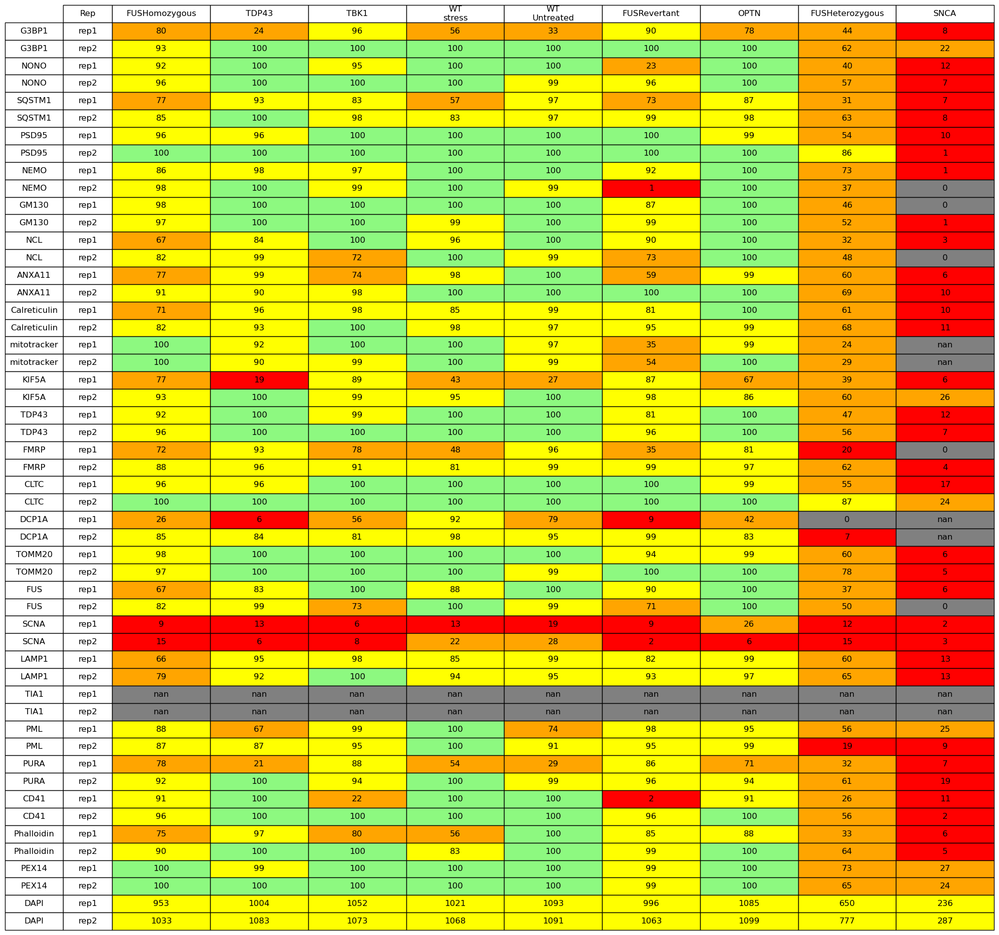

batch680pct
Folder structure is invalid. Missing 9 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/FUSHomozygous/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/TDP43/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/TBK1/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/WT/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/WT/stress/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/FUSRevertant/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/OPTN/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch680pct/FUSHete

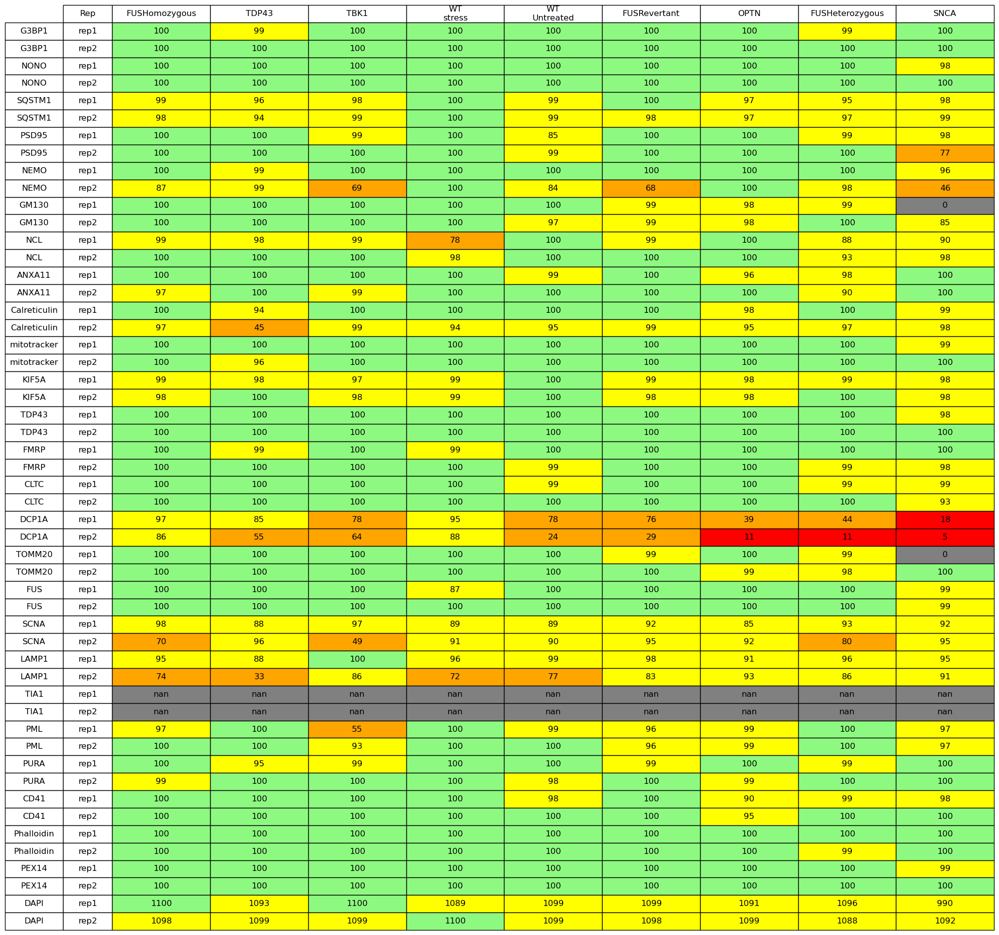

batch780pct
Folder structure is invalid. Missing 9 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/FUSHomozygous/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/TDP43/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/TBK1/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/WT/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/WT/stress/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/FUSRevertant/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/OPTN/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch780pct/FUSHete

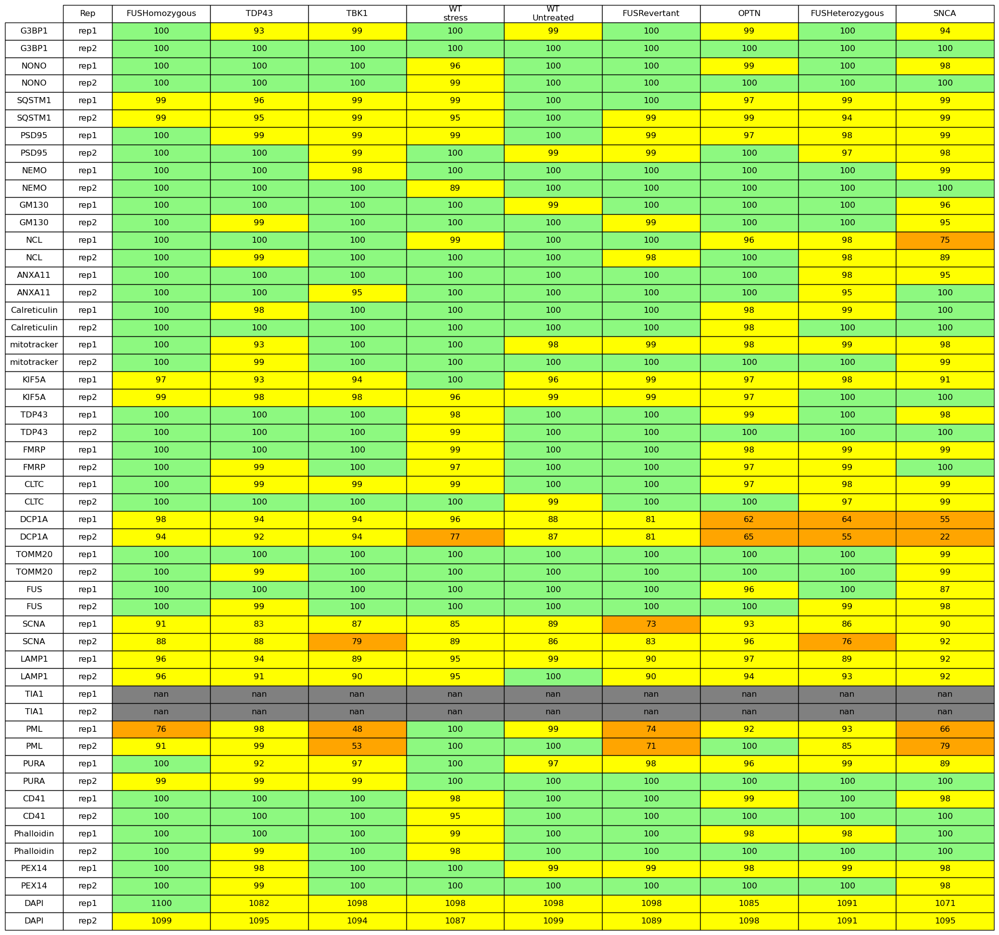

batch880pct
Folder structure is invalid. Missing 9 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/FUSHomozygous/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/TDP43/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/TBK1/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/WT/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/WT/stress/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/FUSRevertant/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/OPTN/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch880pct/FUSHete

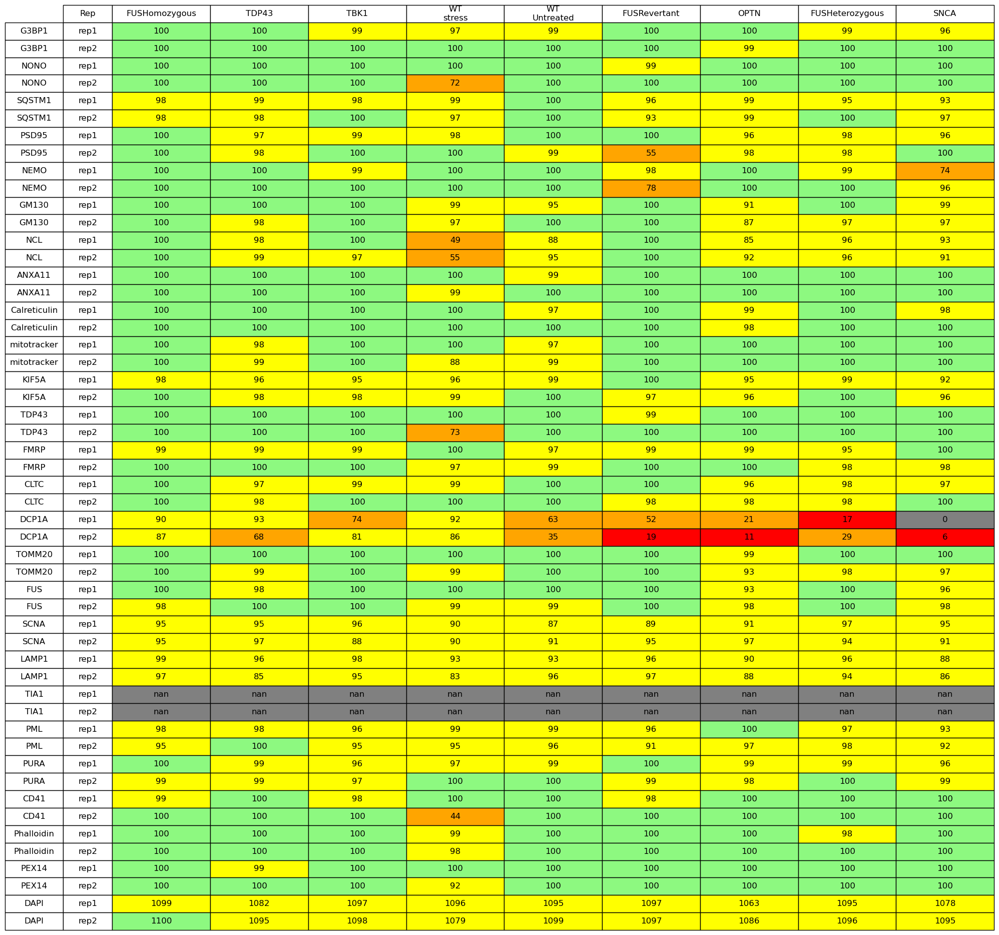

batch980pct
Folder structure is invalid. Missing 9 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/FUSHomozygous/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/TDP43/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/TBK1/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/WT/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/WT/stress/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/FUSRevertant/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/OPTN/Untreated/TIA1
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch980pct/FUSHete

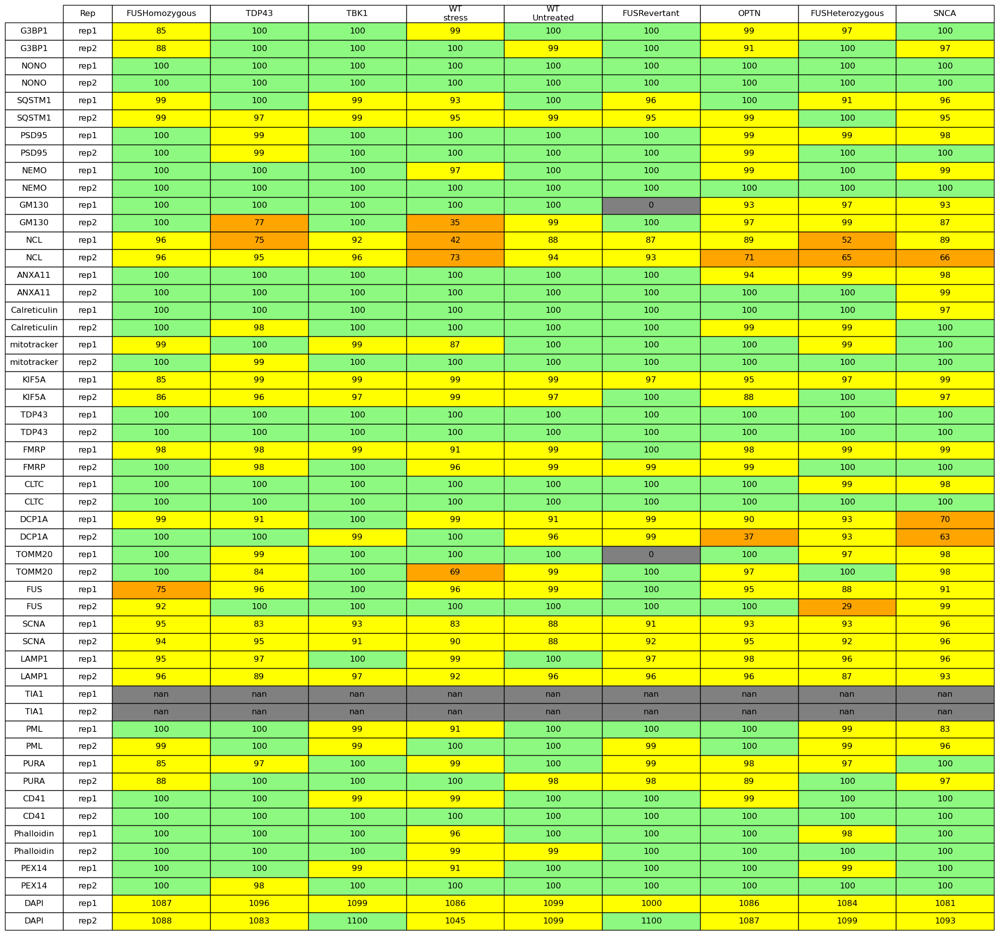

In [11]:
root_directory_proc = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'processed', 'spd2',
                              'SpinningDisk')
procs = run_validate_folder_structure(root_directory_proc, True, panels, markers,PLOT_PATH,marker_info,
                                    cell_lines_to_cond, reps, cell_lines_for_disp, expected_dapi_raw,
                                     batches=[b.replace('_' ,'') for b in batches])

### Difference between Raw and Processed

batch480pct


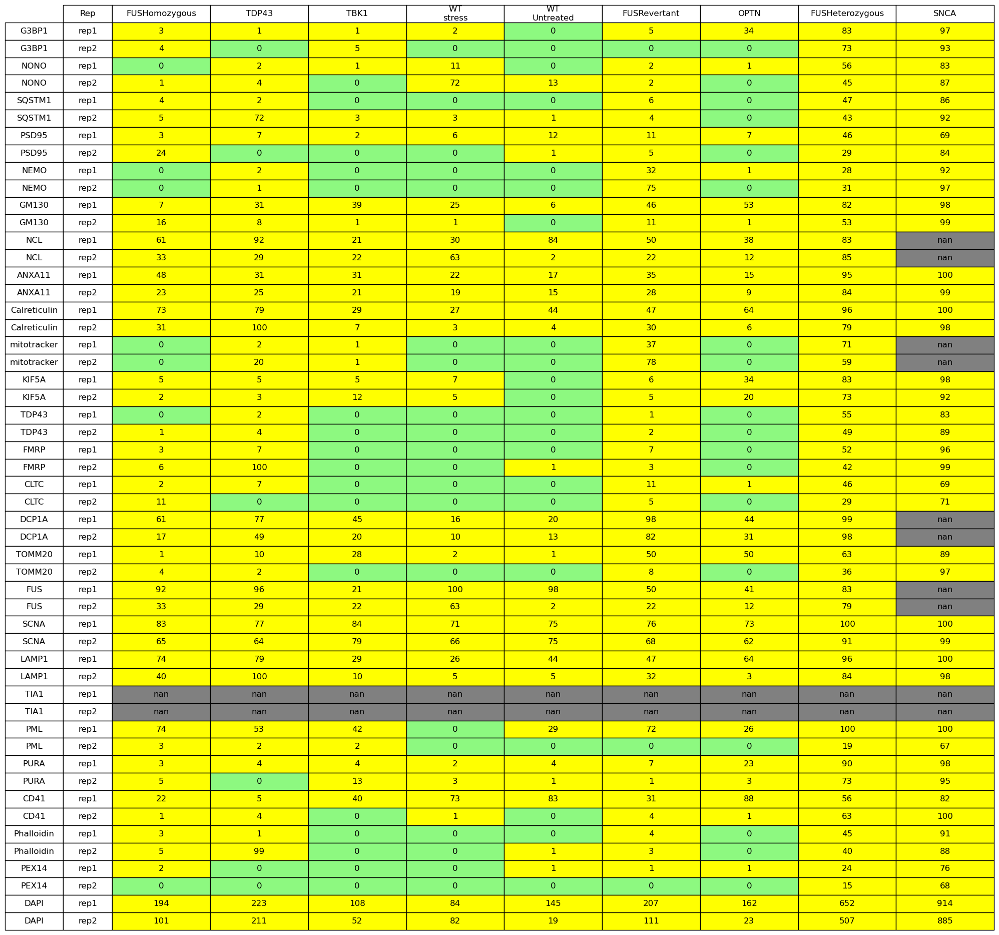

batch580pct


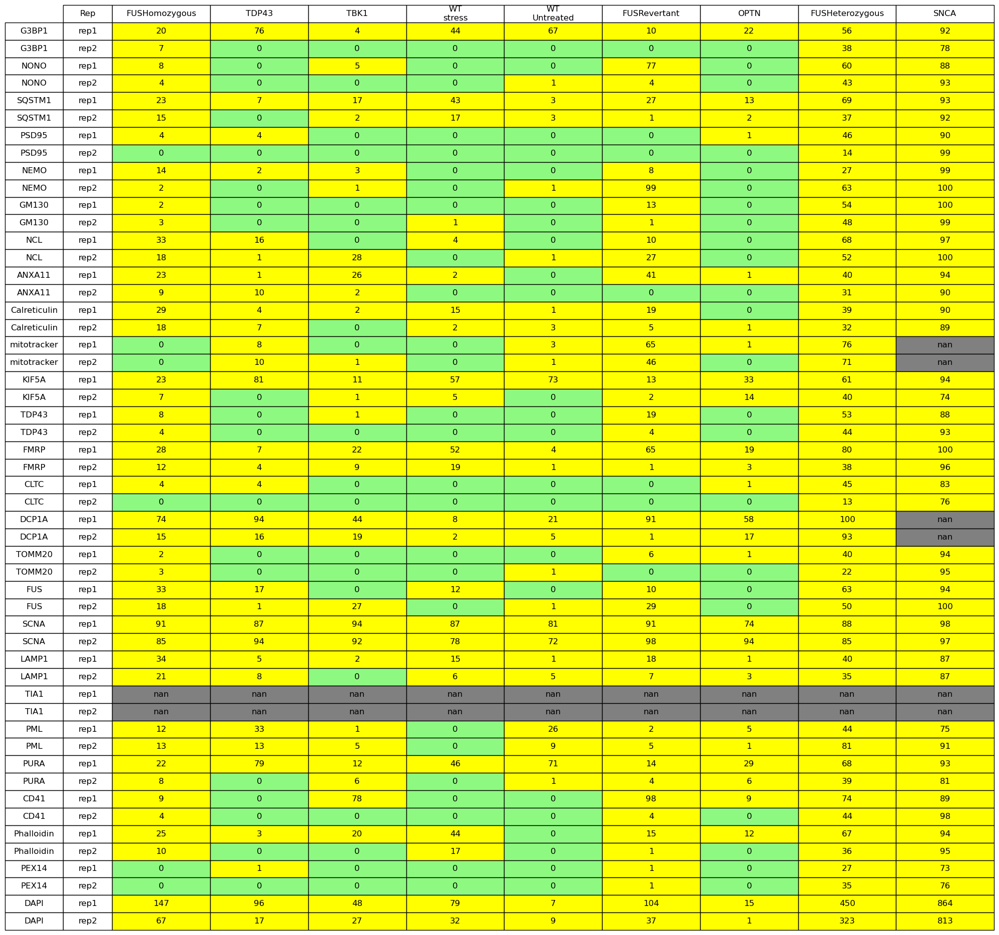

batch680pct


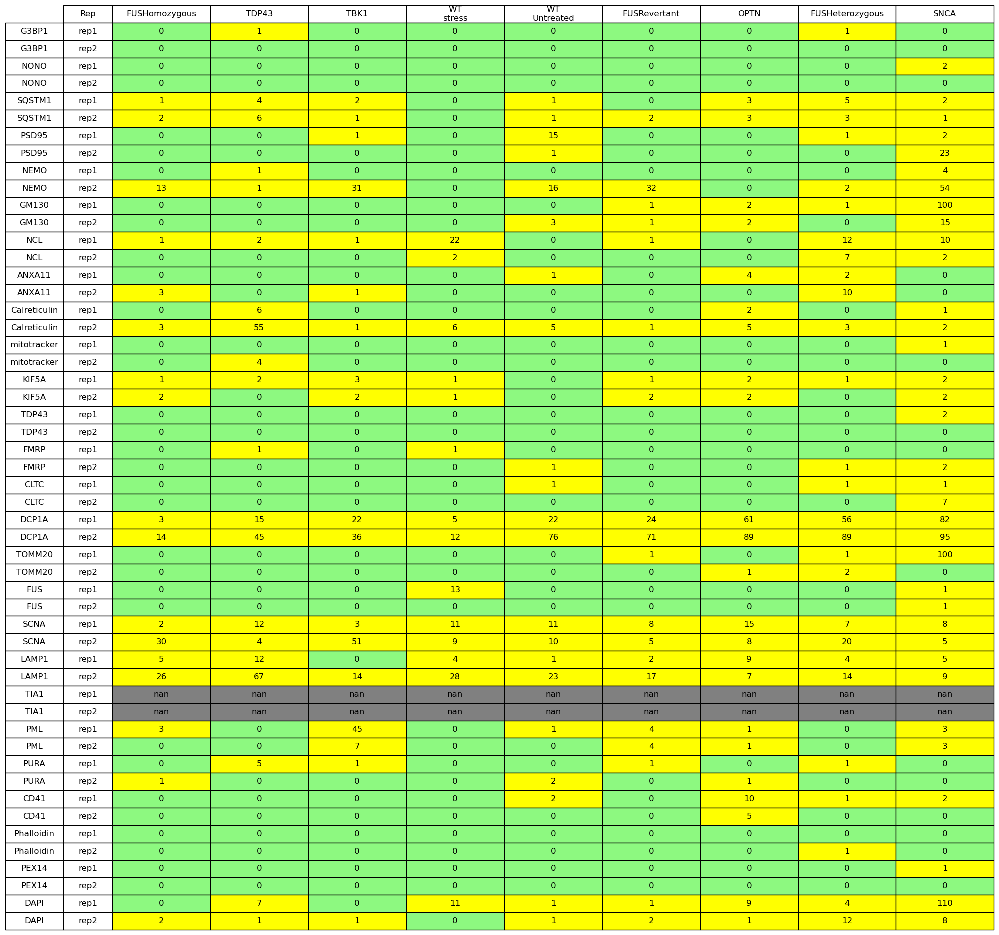

batch780pct


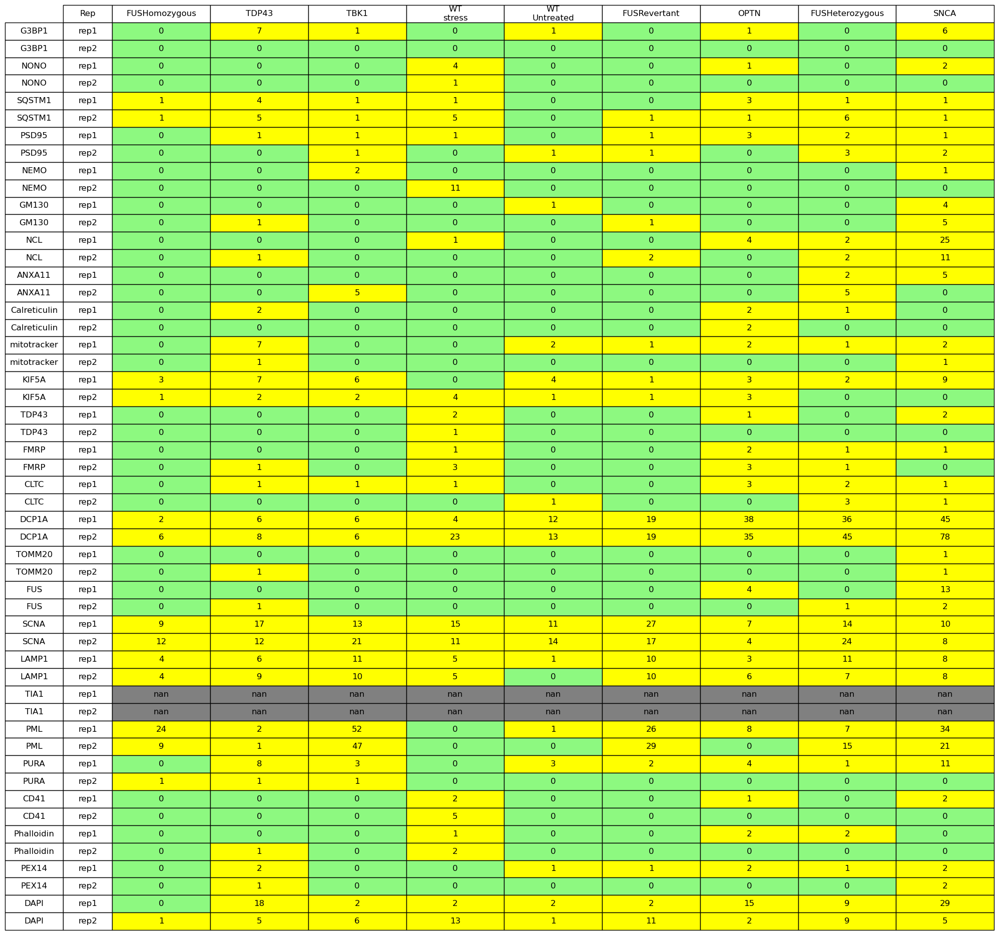

batch880pct


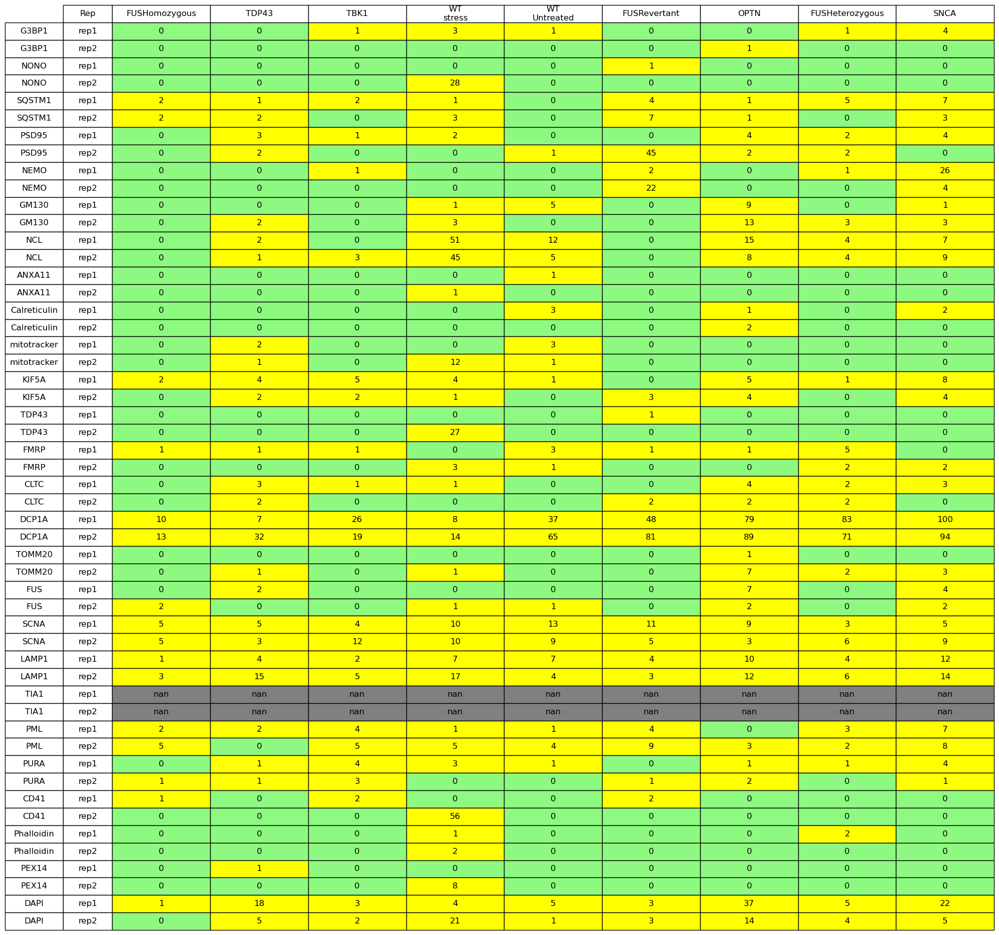

batch980pct


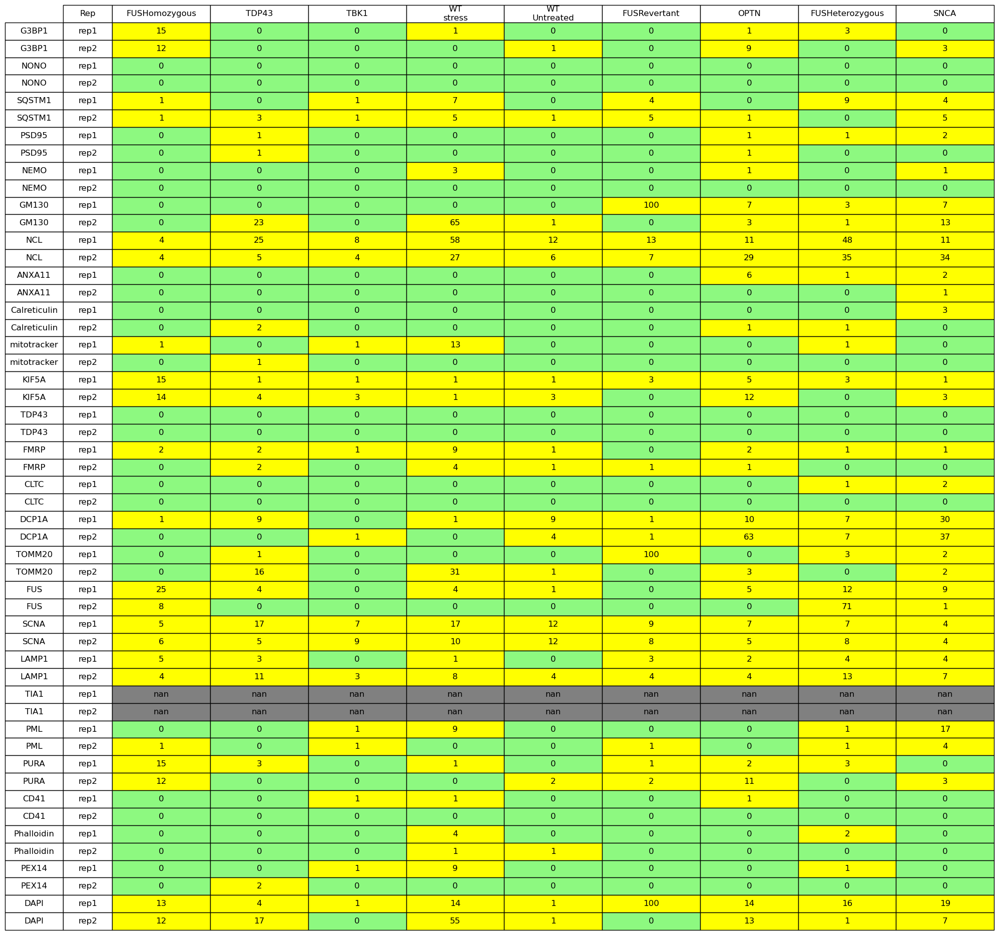

In [12]:
display_diff([b.replace('_' ,'') for b in batches], raws, procs, PLOT_PATH)

### Variance in each batch (of processed files)

In [14]:
for batch in [b.replace('_' ,'') for b in batches]:
    with contextlib.redirect_stdout(io.StringIO()):
        var = sample_and_calc_variance(root_directory_proc, batch, 
                                       sample_size_per_markers=200, num_markers=26)
    print(f'{batch} var: ',var)

batch480pct var:  0.013879759127395547
batch580pct var:  0.01465693589444823
batch680pct var:  0.016318794177940892
batch780pct var:  0.015915956429535652
batch880pct var:  0.01624548708320466
batch980pct var:  0.016589288094179956


## Preprocessing Filtering qc
By order of filtering

### 1. % site survival after Brenner on DAPI channel
Percentage out of the total sites

In [19]:
df_dapi['batch'].unique()

array(['batch4', 'batch5', 'batch6', 'batch7', 'batch8', 'batch9'],
      dtype=object)

In [ ]:
df_dapi['batch'] = df_dapi['batch']+'80pct'

127745    batch480pct
127742    batch480pct
127739    batch480pct
127736    batch480pct
127733    batch480pct
             ...     
301941    batch980pct
301945    batch980pct
301949    batch980pct
301953    batch980pct
301957    batch980pct
Name: batch, Length: 115871, dtype: object

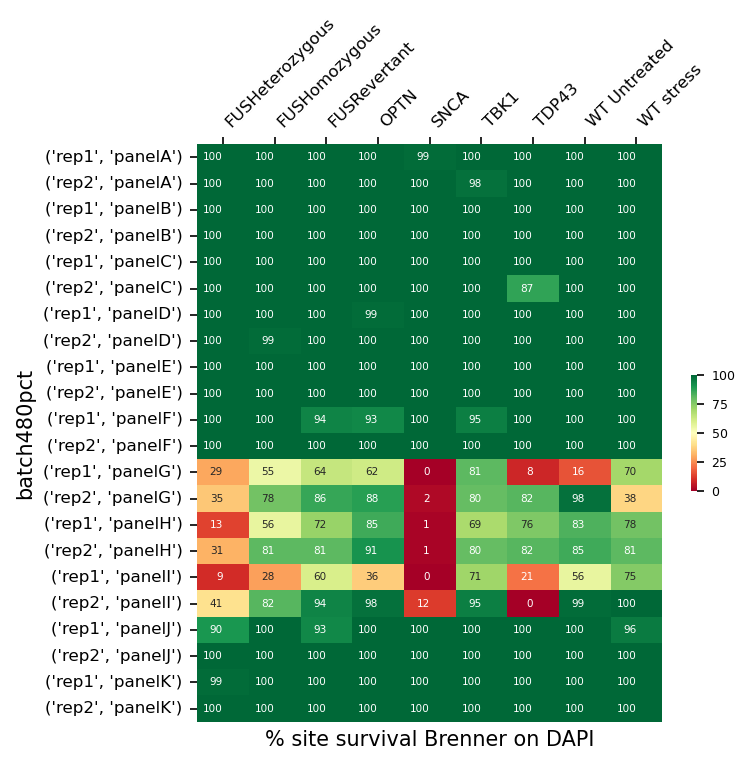

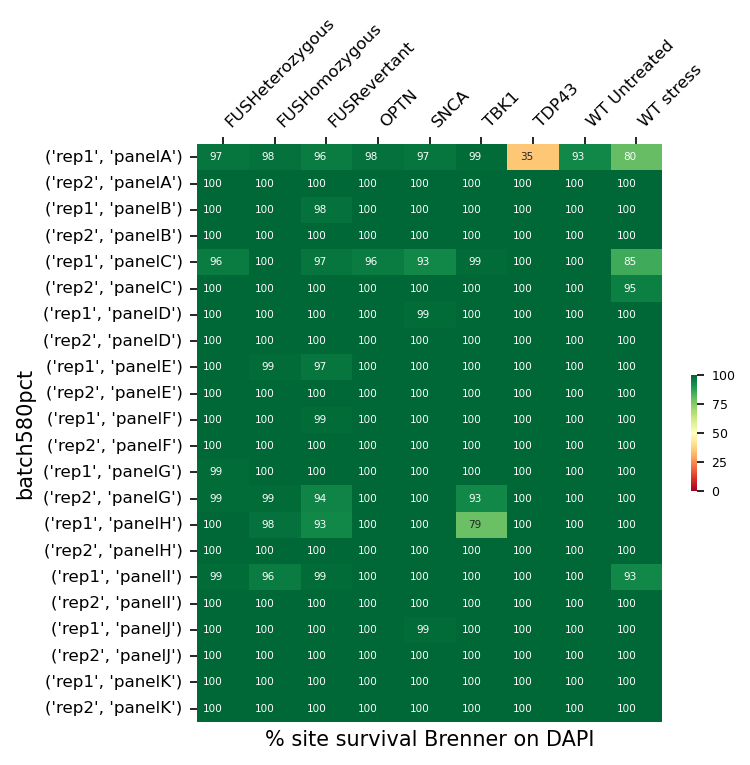

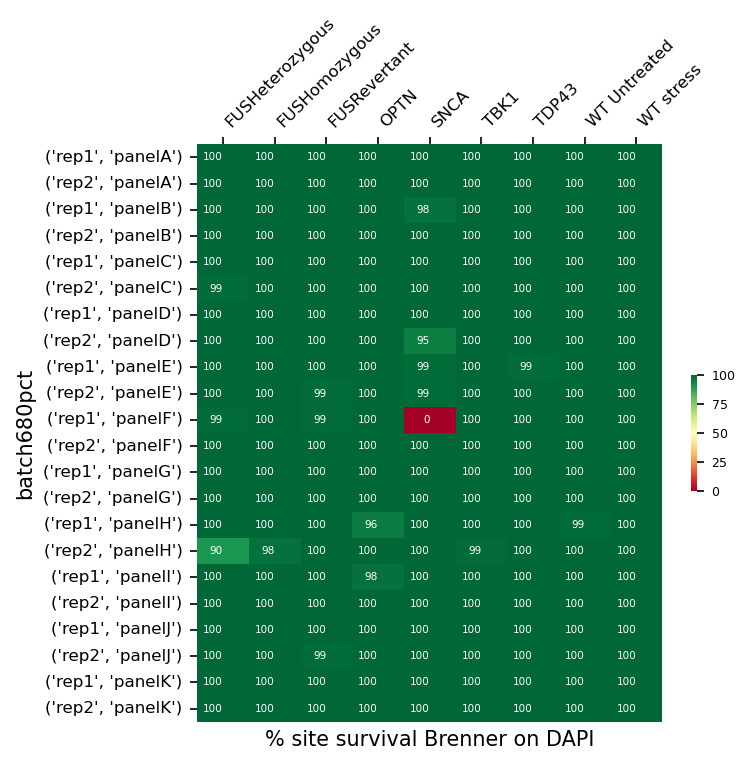

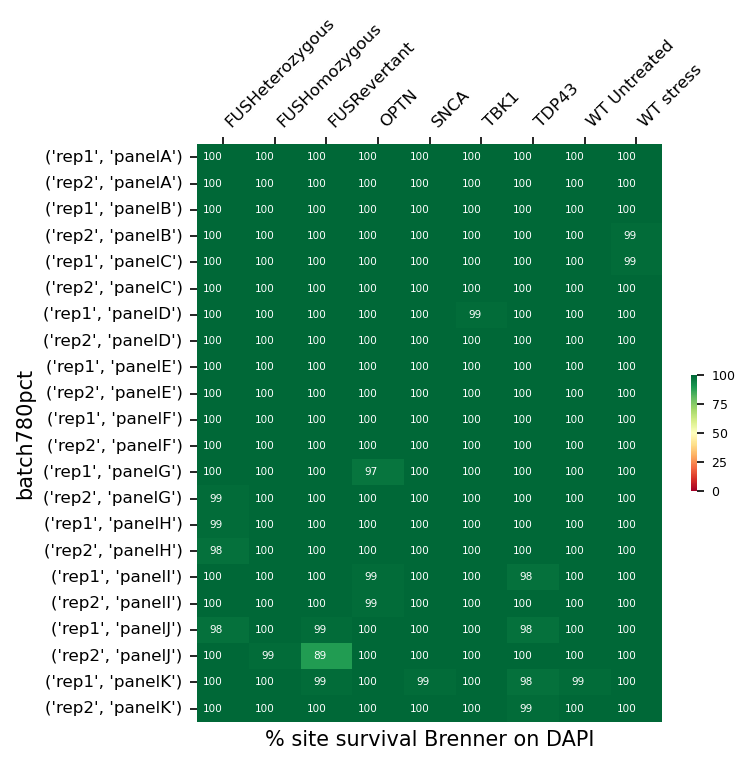

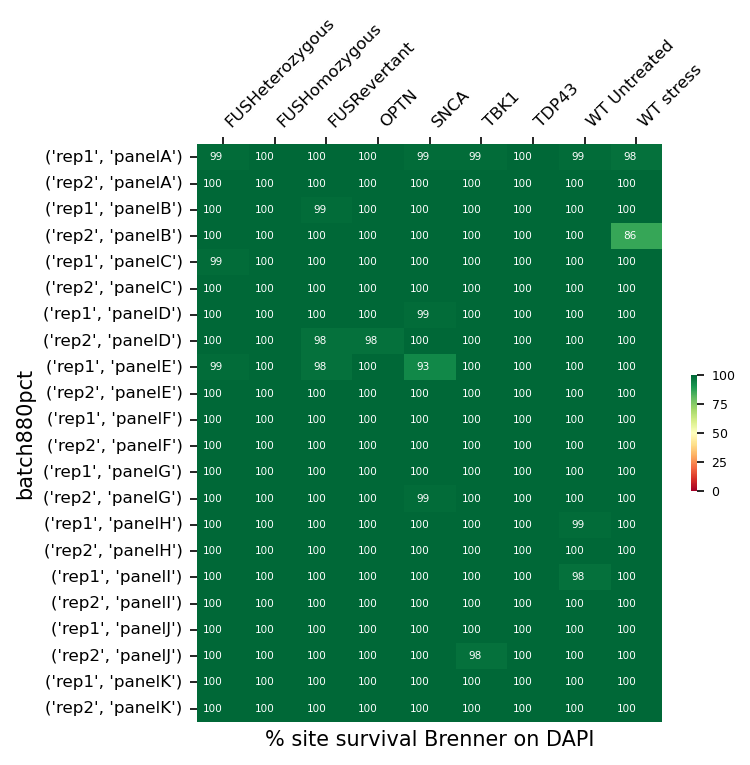

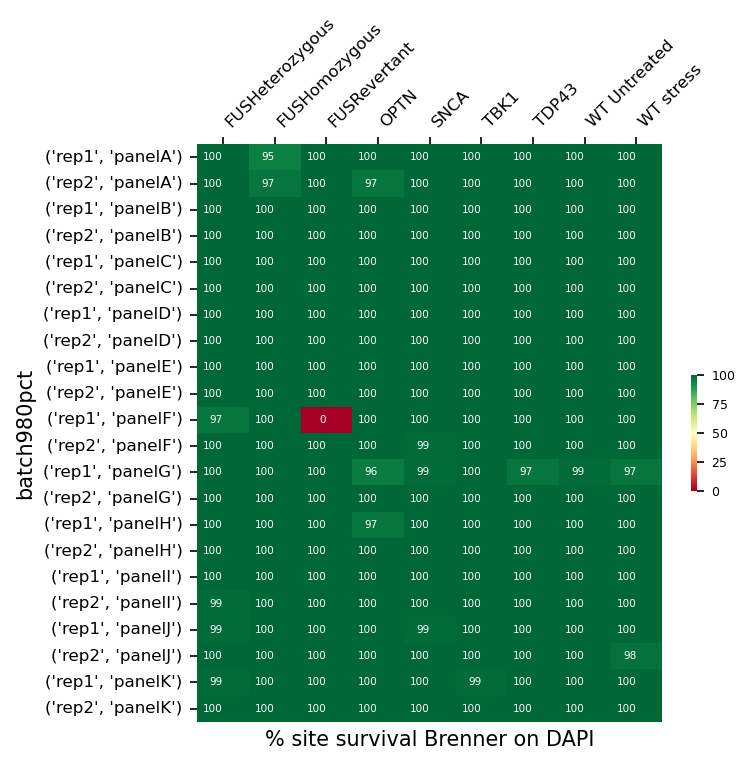

In [32]:
dapi_filter_by_brenner = show_site_survival_dapi_brenner(df_dapi,[b.replace('_' ,'') for b in batches], line_colors, panels, reps)

### 2. % Site survival after Cellpose
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if Cellpose found 0 cells in it.**

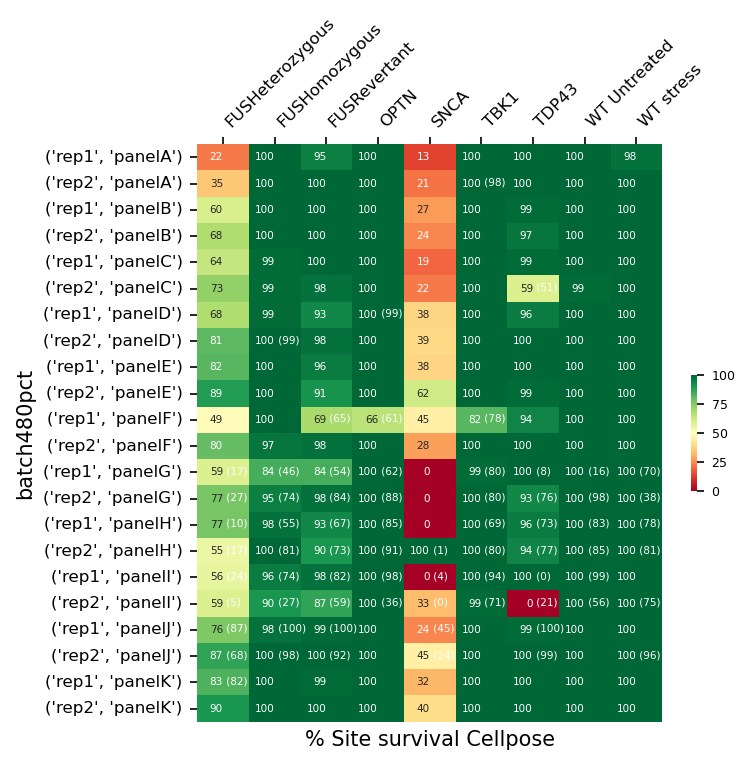

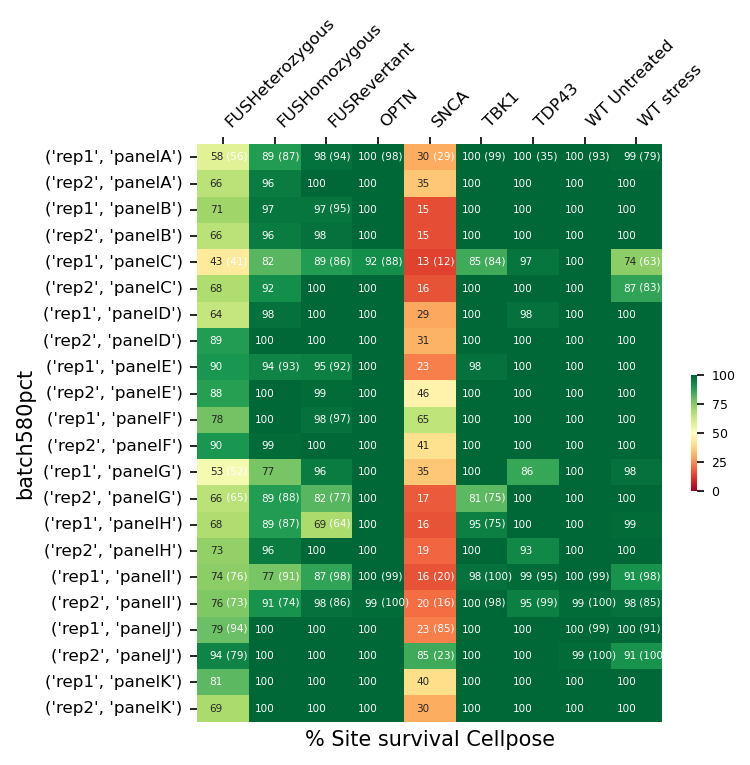

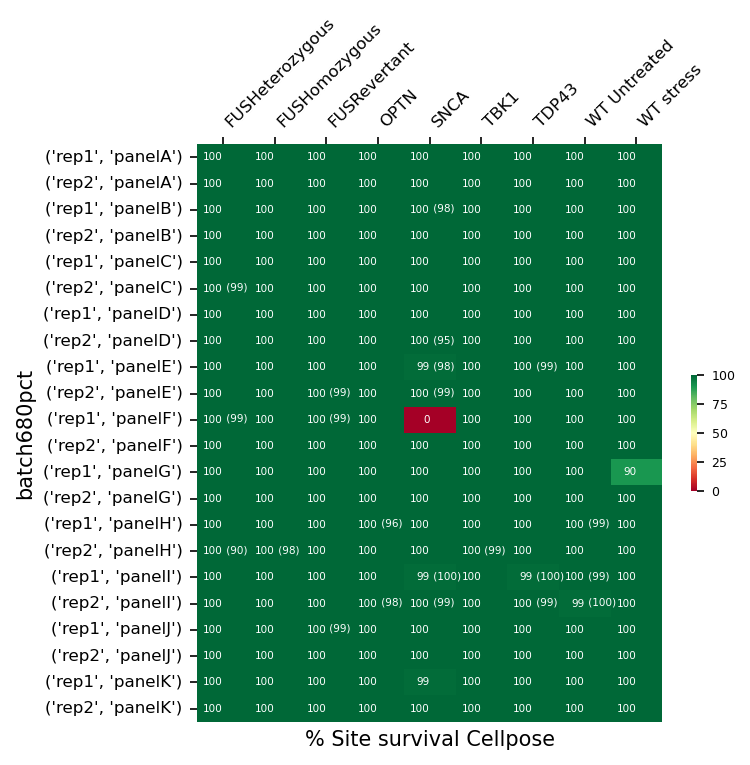

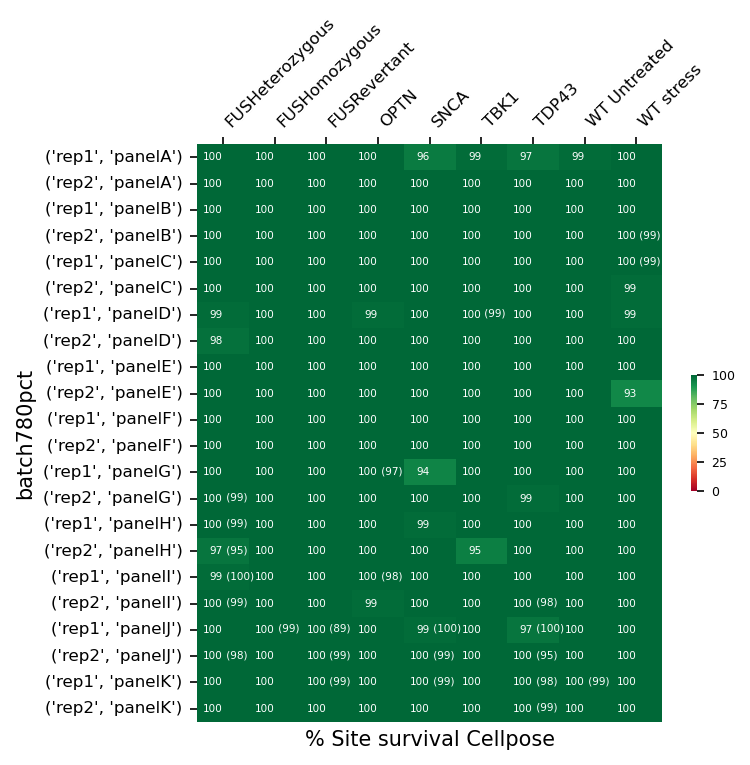

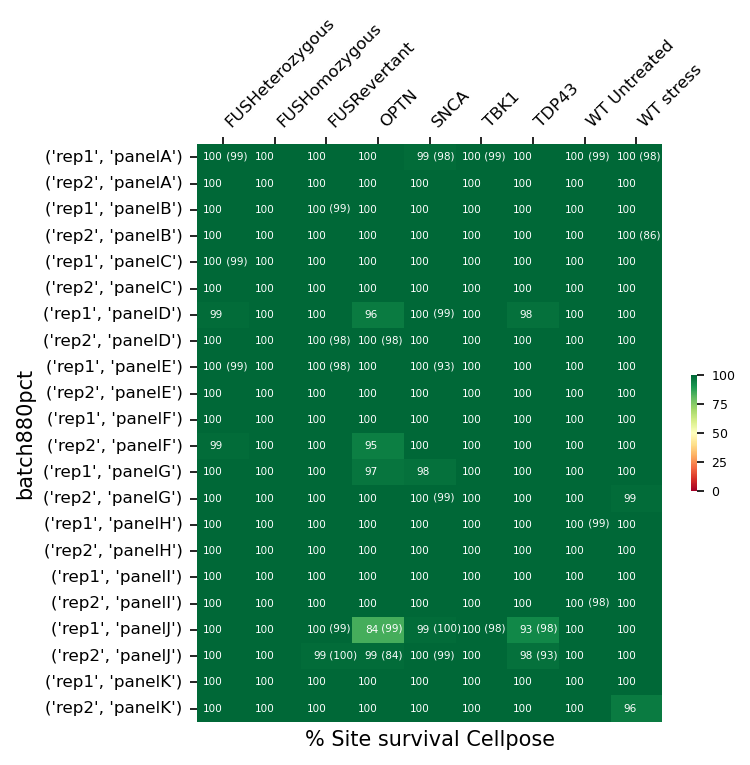

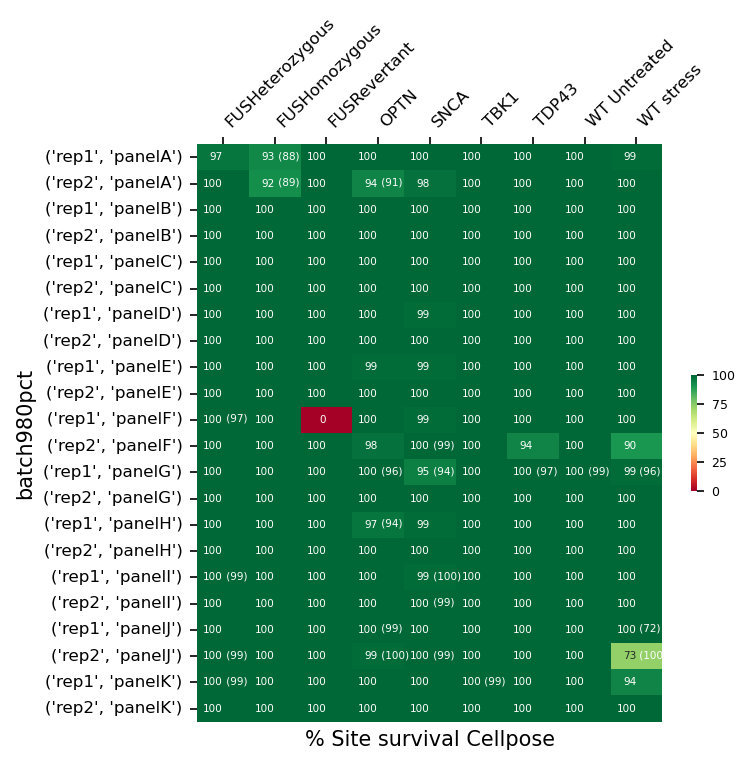

In [33]:
dapi_filter_by_cellpose = show_site_survival_dapi_cellpose(df_dapi, [b.replace('_' ,'') for b in batches], dapi_filter_by_brenner, line_colors, panels, reps)

### 3. % Site survival by tiling
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if after tiling, no tile is containing at least one whole cell that Cellpose detected.**

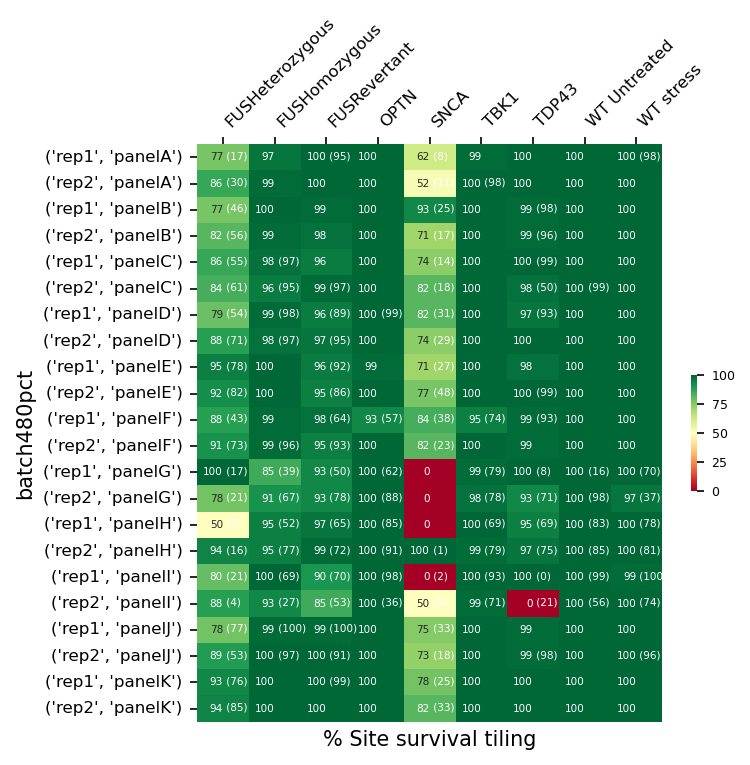

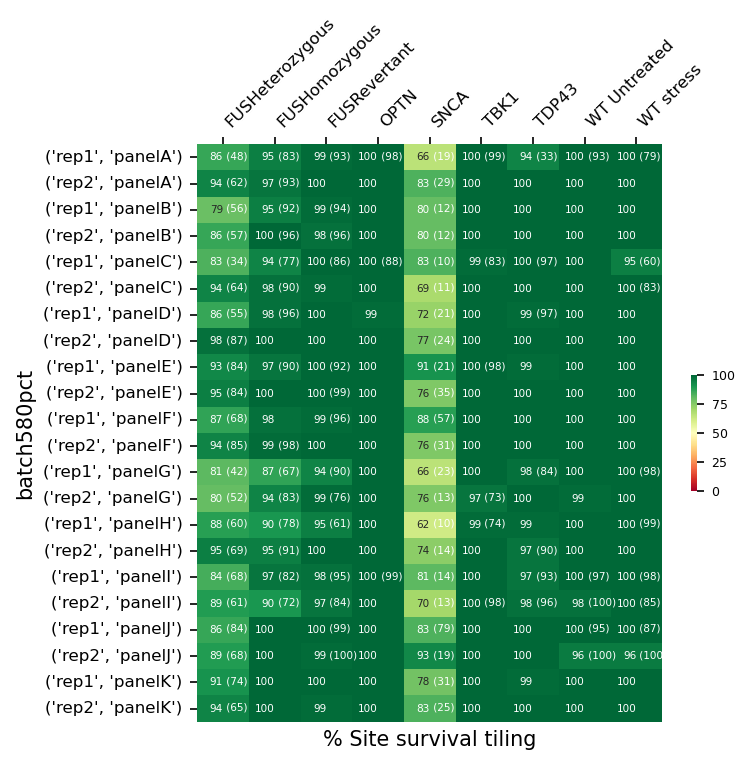

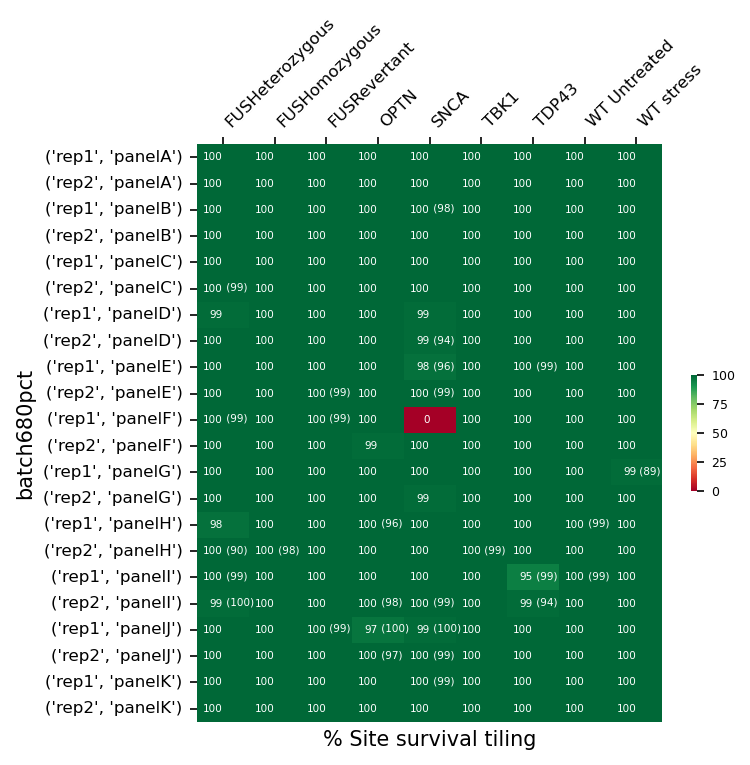

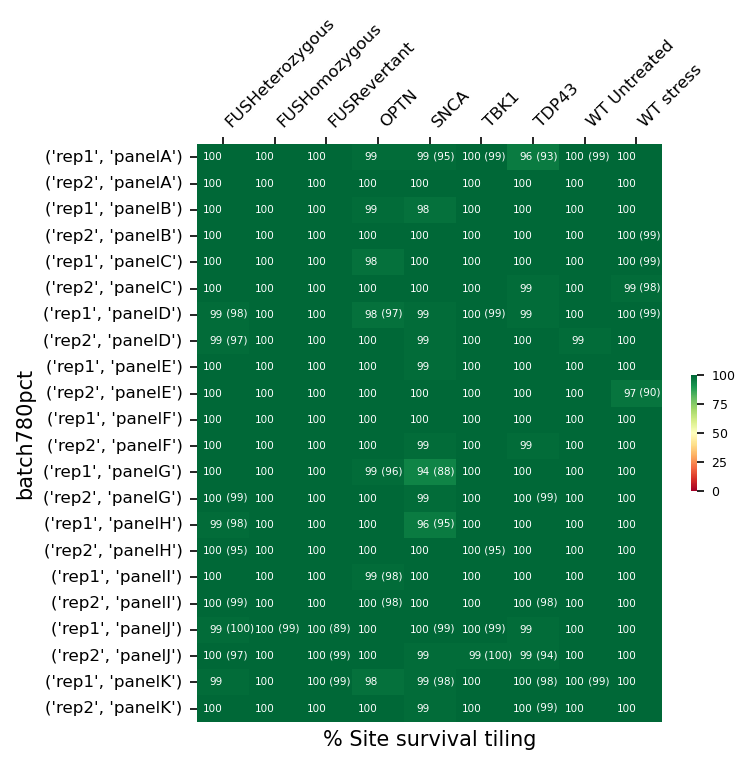

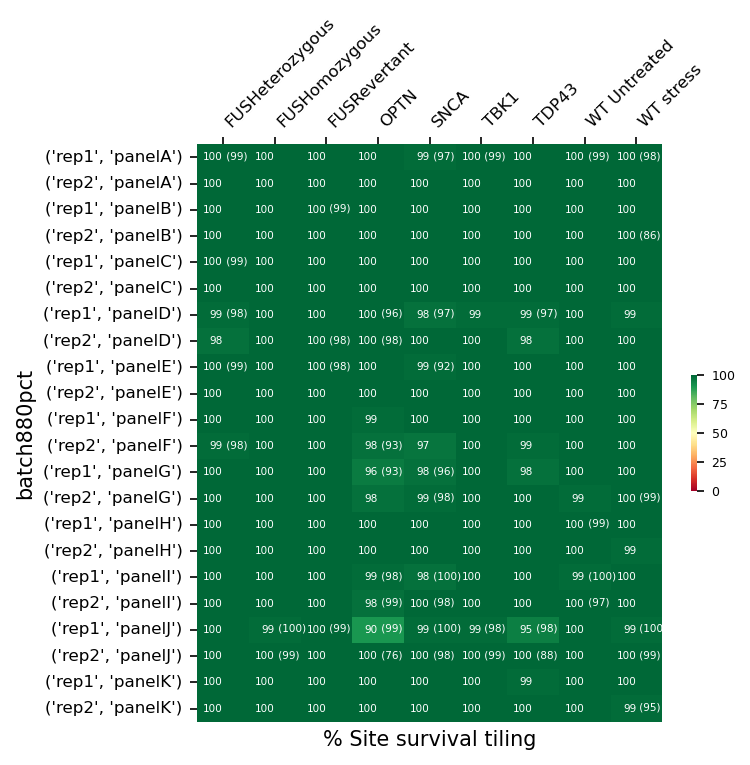

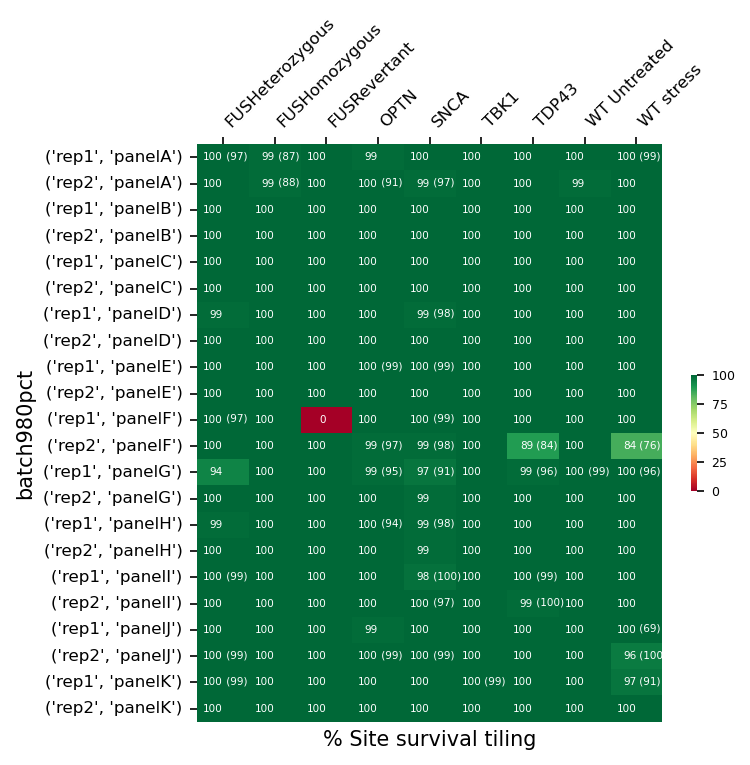

In [35]:
dapi_filter_by_tiling=show_site_survival_dapi_tiling(df_dapi, [b.replace('_' ,'') for b in batches], dapi_filter_by_cellpose, line_colors, panels, reps)

### 4. % Site survival after Brenner on target channel
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

In [38]:
df_target['batch'] = df_target['batch'] + '80pct'

/tmp/ipykernel_2398209/478997977.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_target['batch'] = df_target['batch'] + '80pct'


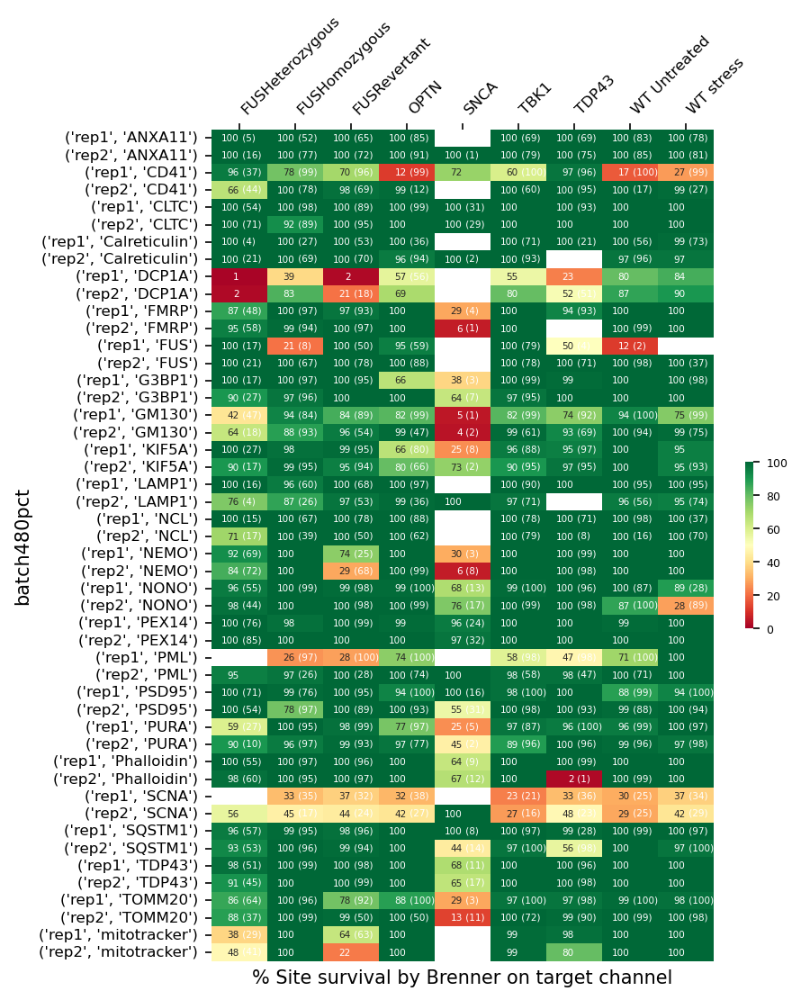

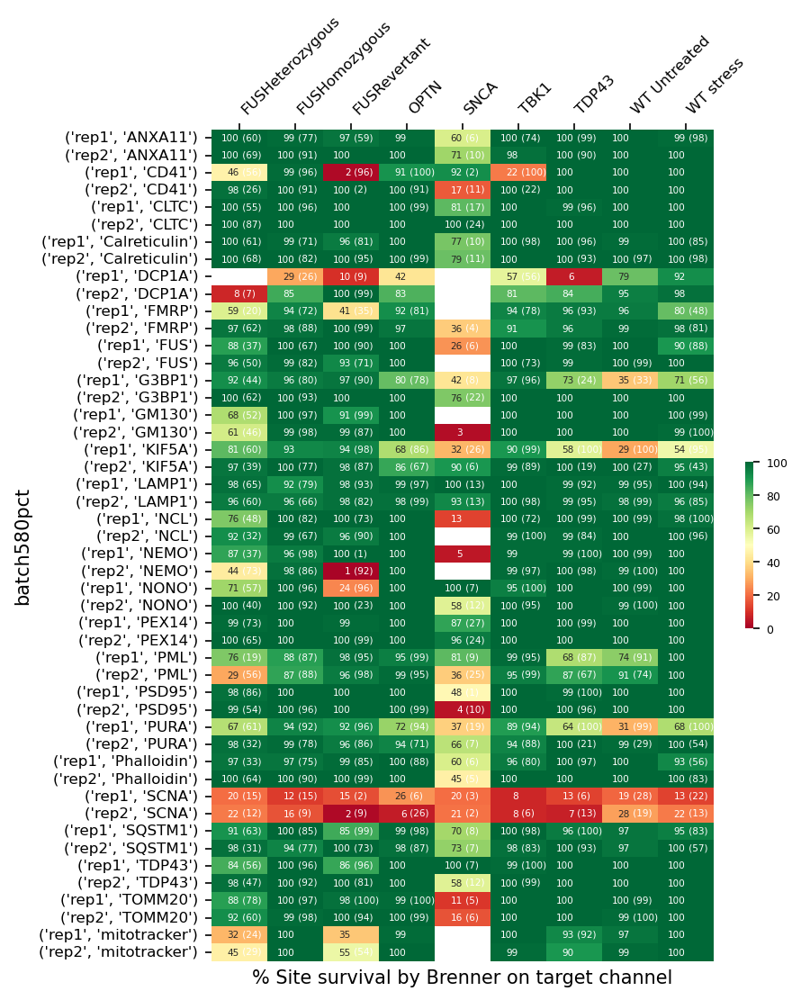

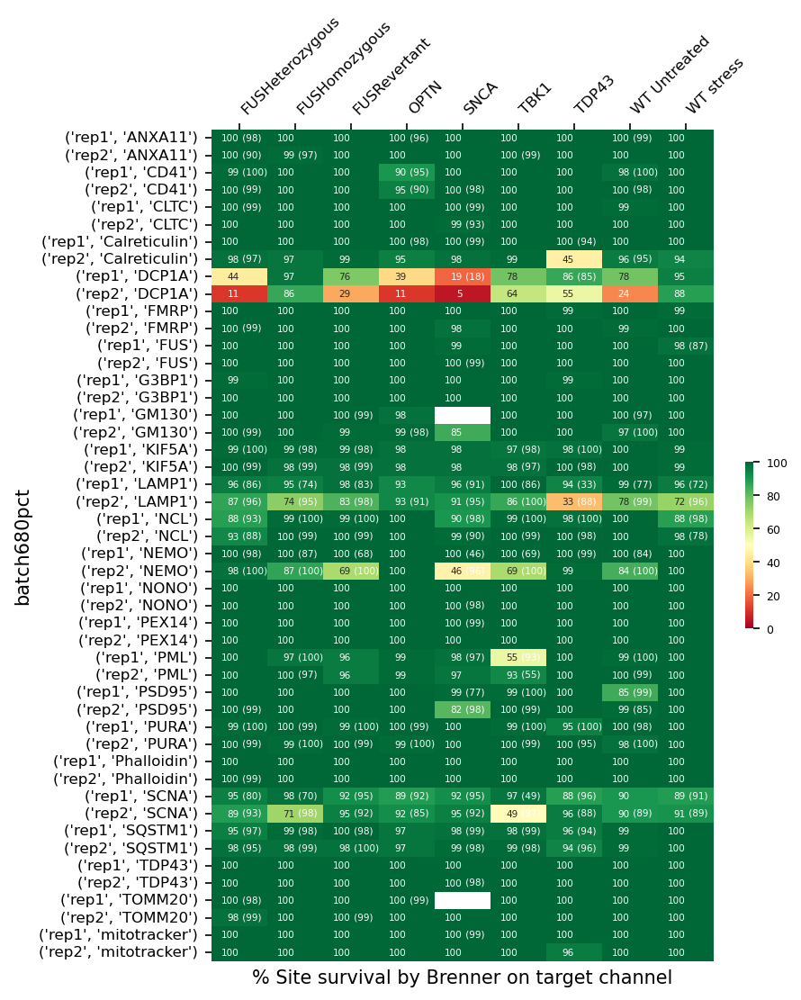

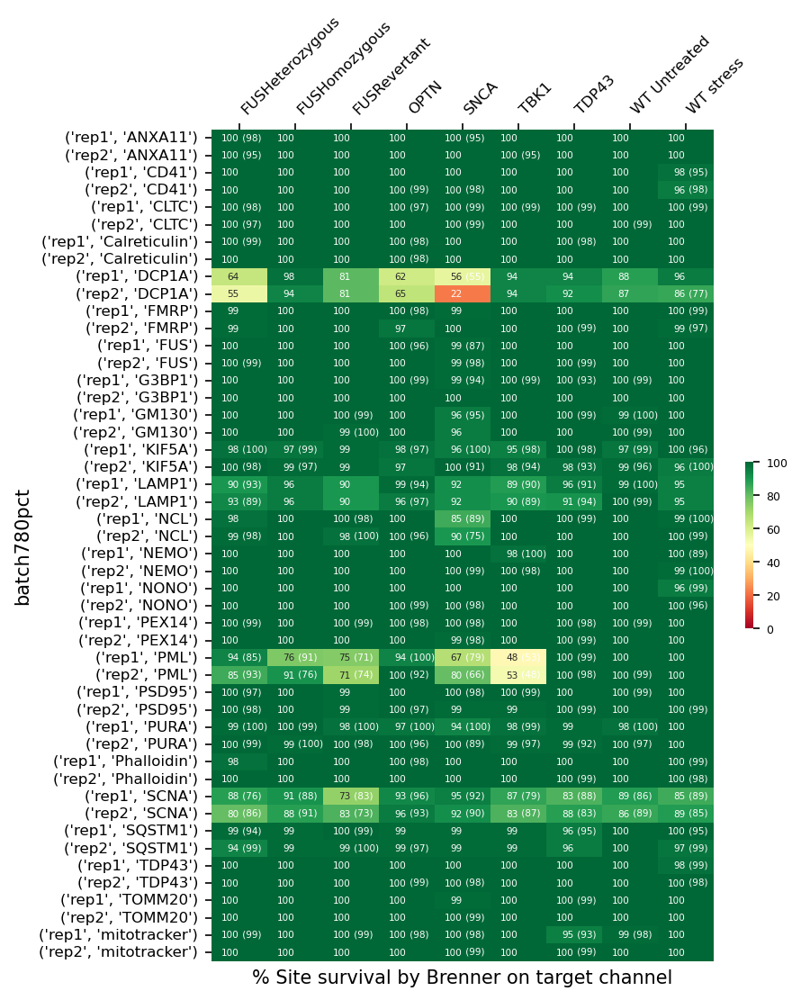

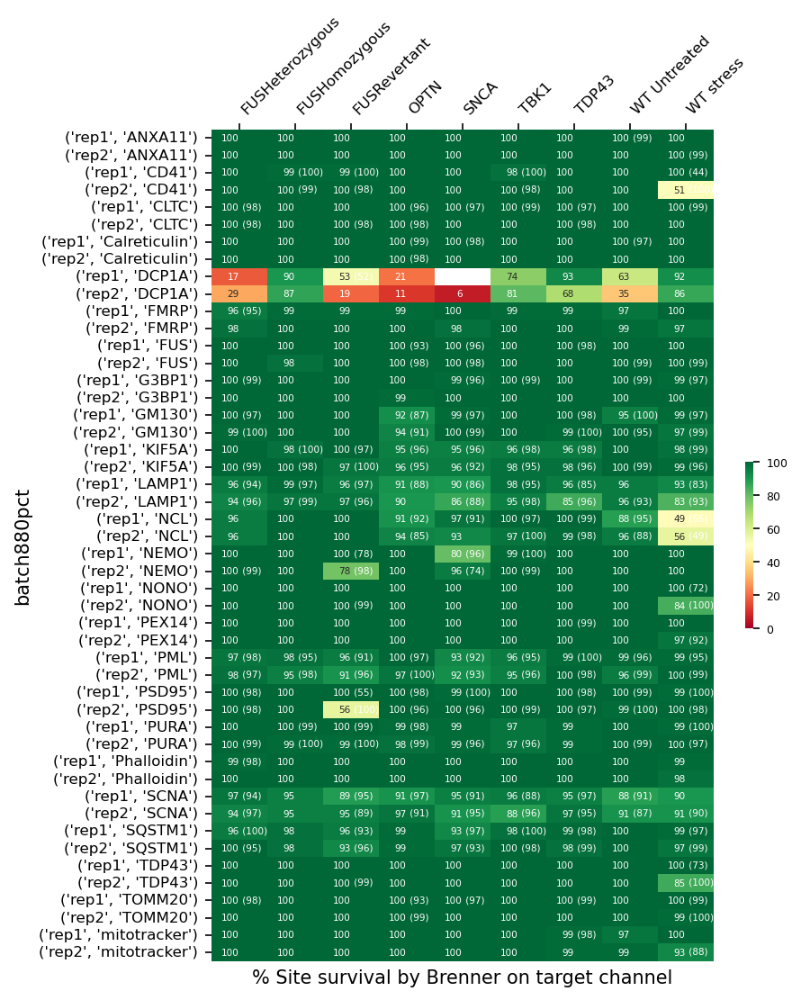

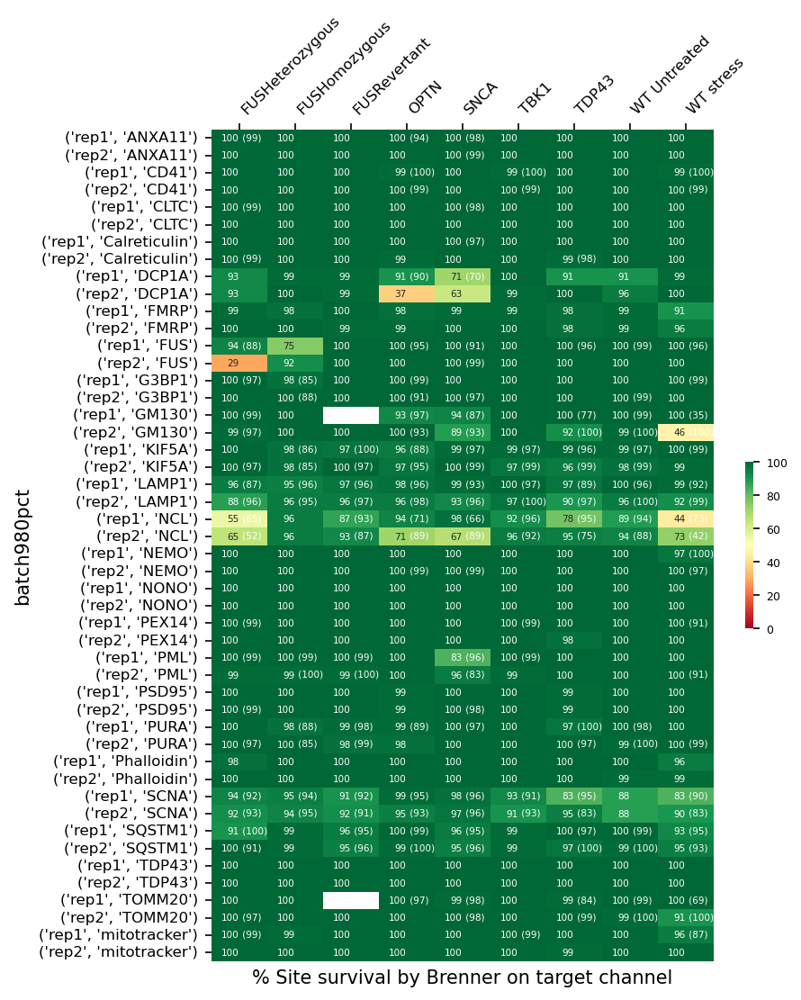

In [39]:
show_site_survival_target_brenner(df_dapi, df_target, dapi_filter_by_tiling, markers)

## Statistics About the Processed Files

In [40]:
stats = ['n_valid_tiles','site_whole_cells_counts_sum','site_cell_count','site_cell_count_sum']
total_sum = calc_total_sums(df_target, df_dapi, stats, markers)

### Total tiles

In [41]:
total_sum[~total_sum.marker.str.contains('TIA', regex=True)].n_valid_tiles.sum()


3644451

In [42]:
## Total tiles in wt lines
total_sum[(~total_sum.marker.str.contains('TIA', regex=True))&
         (total_sum.cell_line_cond.isin(['WT stress', 'WT Untreated']))].n_valid_tiles.sum()

987532

In [43]:
## Total tiles in untreated lines
total_sum[(~total_sum.marker.str.contains('TIA', regex=True))&
         ((~total_sum.cell_line_cond.str.contains('WT')) | (total_sum.cell_line_cond=='WT Untreated'))].n_valid_tiles.sum()

3168336

### Total whole nuclei in tiles

In [44]:
total_sum[total_sum.marker =='DAPI'].site_whole_cells_counts_sum.sum()

791512.0

### Total nuclei in sites

In [45]:
total_sum[total_sum.marker =='DAPI'].site_cell_count.sum()

1959995.0

### Total tiles in training batches

In [46]:
total_sum[(total_sum.batch.str.contains('7|8', regex=True))
          & (~total_sum.marker.str.contains('TIA1', regex=True))].n_valid_tiles.sum()

3644451

### Training: Total whole nuclei in tiles

In [47]:
total_sum[(total_sum.batch.str.contains('7|8', regex=True)) 
          & (total_sum.marker =='DAPI')].site_whole_cells_counts_sum.sum()

791512.0

In [48]:
show_total_sum_tables(total_sum)

,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch480pct,,,,
count,607.000000,607.000000,607.000000,607.000000
mean,710.199341,7.101993,513.047776,1188.367381
std,522.578734,5.225787,387.256943,904.919411
min,0.000000,0.000000,0.000000,0.000000
25%,215.000000,2.150000,141.500000,341.000000
50%,676.000000,6.760000,479.000000,1109.000000
75%,1213.000000,12.130000,869.500000,1979.000000
max,1724.000000,17.240000,1295.000000,3027.000000
sum,431091.000000,NaN,311420.000000,721339.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch580pct,,,,
count,620.000000,620.000000,620.000000,620.000000
mean,797.748387,7.977484,577.759677,1345.653226
std,532.103687,5.321037,390.147690,924.290458
min,1.000000,0.010000,1.000000,1.000000
25%,284.750000,2.847500,205.750000,451.000000
50%,852.500000,8.525000,598.000000,1434.000000
75%,1252.000000,12.520000,902.000000,2108.000000
max,1715.000000,17.150000,1280.000000,2987.000000
sum,494604.000000,NaN,358211.000000,834305.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch680pct,,,,
count,627.000000,627.000000,627.000000,6.270000e+02
mean,1134.452951,11.344530,743.443381,1.957804e+03
std,286.694384,2.866944,193.932668,5.264662e+02
min,48.000000,0.480000,36.000000,8.400000e+01
25%,930.500000,9.305000,612.000000,1.578000e+03
50%,1169.000000,11.690000,755.000000,1.987000e+03
75%,1332.000000,13.320000,863.000000,2.332000e+03
max,1669.000000,16.690000,1189.000000,2.993000e+03
sum,711302.000000,NaN,466139.000000,1.227543e+06


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch780pct,,,,
count,630.000000,630.000000,630.000000,6.300000e+02
mean,1050.255556,10.502556,716.004762,1.747508e+03
std,285.715774,2.857158,202.354216,5.070049e+02
min,206.000000,2.060000,137.000000,3.220000e+02
25%,839.750000,8.397500,569.000000,1.393250e+03
50%,1057.000000,10.570000,710.000000,1.765000e+03
75%,1265.000000,12.650000,859.500000,2.129750e+03
max,1808.000000,18.080000,1259.000000,3.162000e+03
sum,661661.000000,NaN,451083.000000,1.100930e+06


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch880pct,,,,
count,629.000000,629.00000,629.000000,6.290000e+02
mean,1008.786963,10.08787,670.922099,1.691099e+03
std,277.006006,2.77006,187.112033,4.966986e+02
min,59.000000,0.59000,46.000000,9.100000e+01
25%,836.000000,8.36000,546.000000,1.366000e+03
50%,1002.000000,10.02000,663.000000,1.686000e+03
75%,1199.000000,11.99000,801.000000,2.066000e+03
max,1731.000000,17.31000,1190.000000,2.996000e+03
sum,634527.000000,NaN,422010.000000,1.063701e+06


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch980pct,,,,
count,627.000000,627.000000,627.000000,6.270000e+02
mean,1134.395534,11.343955,753.840510,1.943244e+03
std,313.470280,3.134703,218.646008,5.661427e+02
min,154.000000,1.540000,97.000000,2.360000e+02
25%,917.000000,9.170000,593.500000,1.519000e+03
50%,1175.000000,11.750000,763.000000,2.038000e+03
75%,1375.000000,13.750000,923.500000,2.368000e+03
max,1813.000000,18.130000,1323.000000,3.215000e+03
sum,711266.000000,NaN,472658.000000,1.218414e+06


,n valid tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
All batches,,,,
count,3.740000e+03,3740.000000,3.740000e+03,3.740000e+03
mean,9.744521e+02,9.744521,6.635083e+02,1.648725e+03
std,4.174105e+02,4.174105,2.904877e+02,7.355602e+02
min,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
25%,7.450000e+02,7.450000,4.980000e+02,1.221000e+03
50%,1.019000e+03,10.190000,6.860000e+02,1.717000e+03
75%,1.283000e+03,12.830000,8.630000e+02,2.202750e+03
max,1.813000e+03,18.130000,1.323000e+03,3.215000e+03
sum,3.644451e+06,NaN,2.481521e+06,6.166232e+06


### Show Total Tile Counts
For each batch, cell line, replicate and markerTotal number of tiles

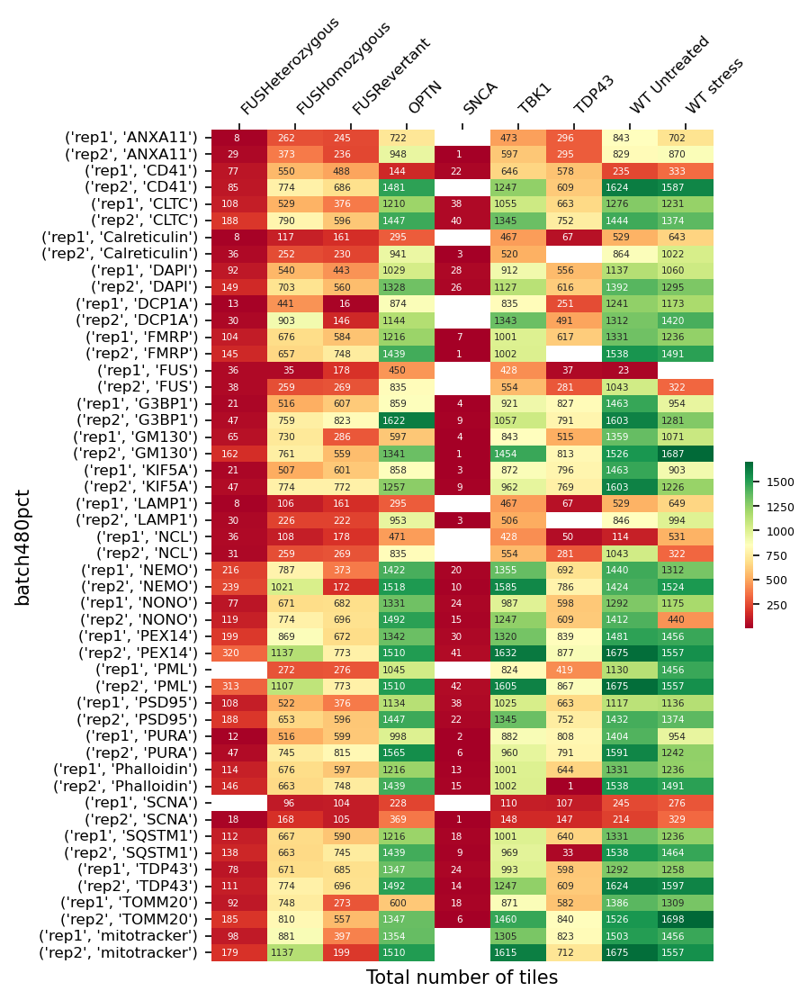

/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


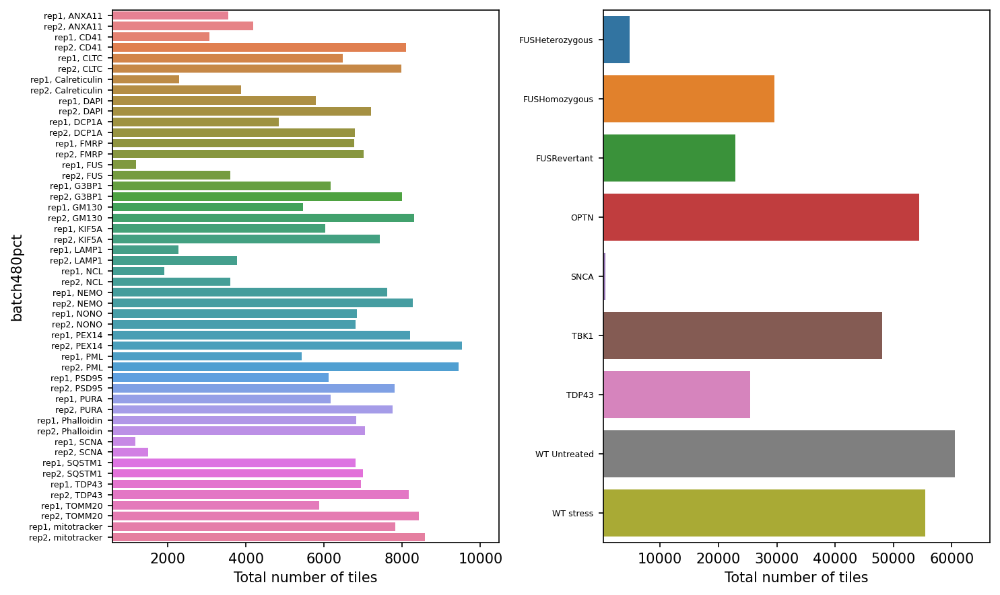

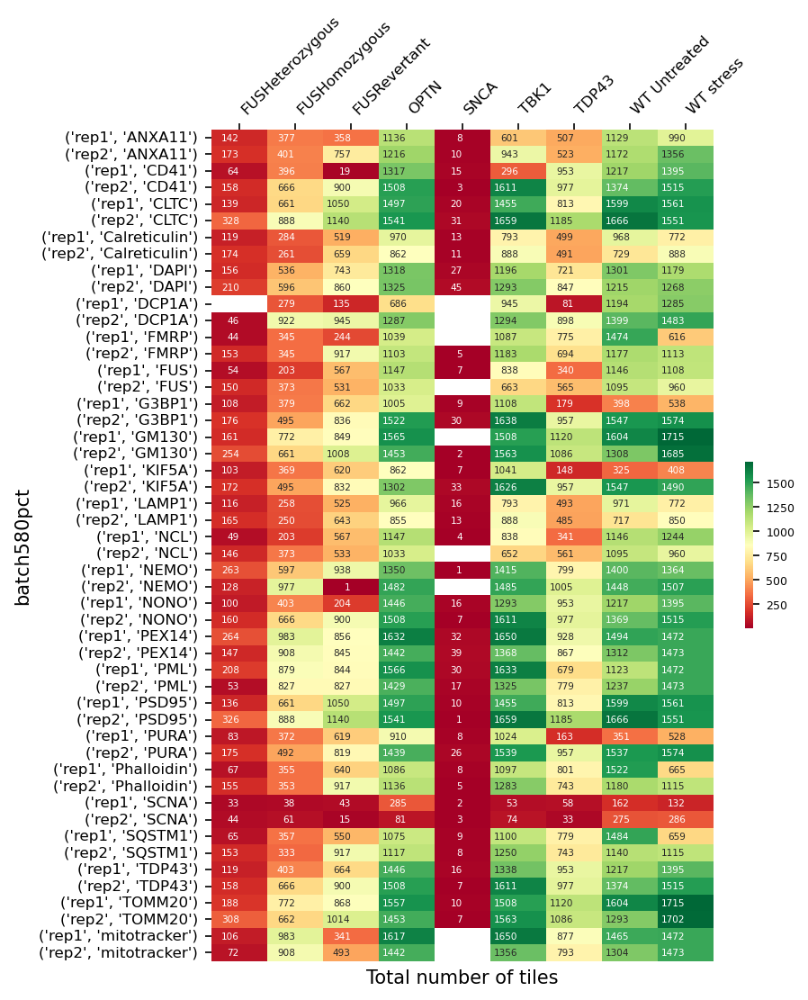

/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


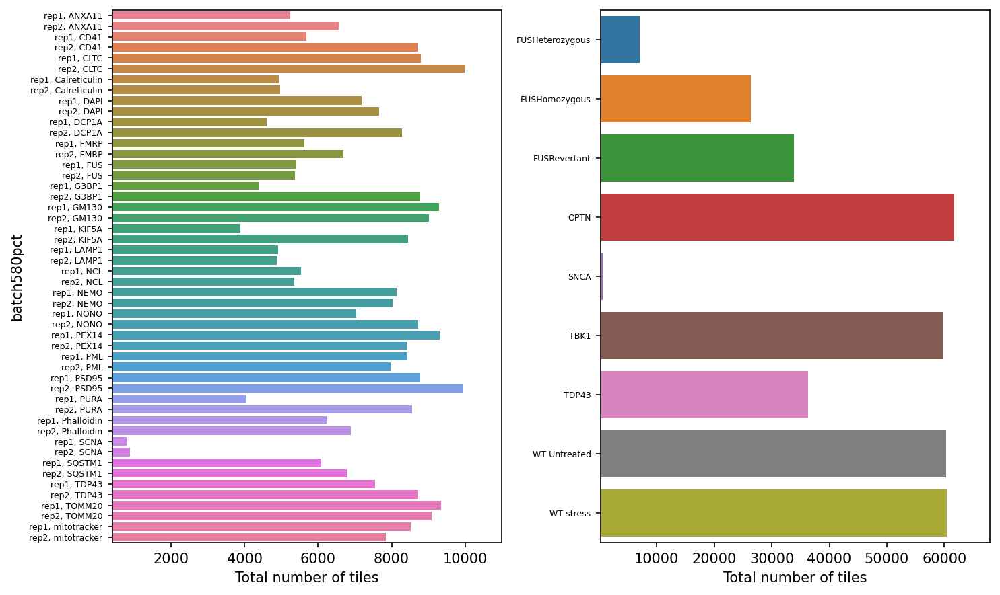

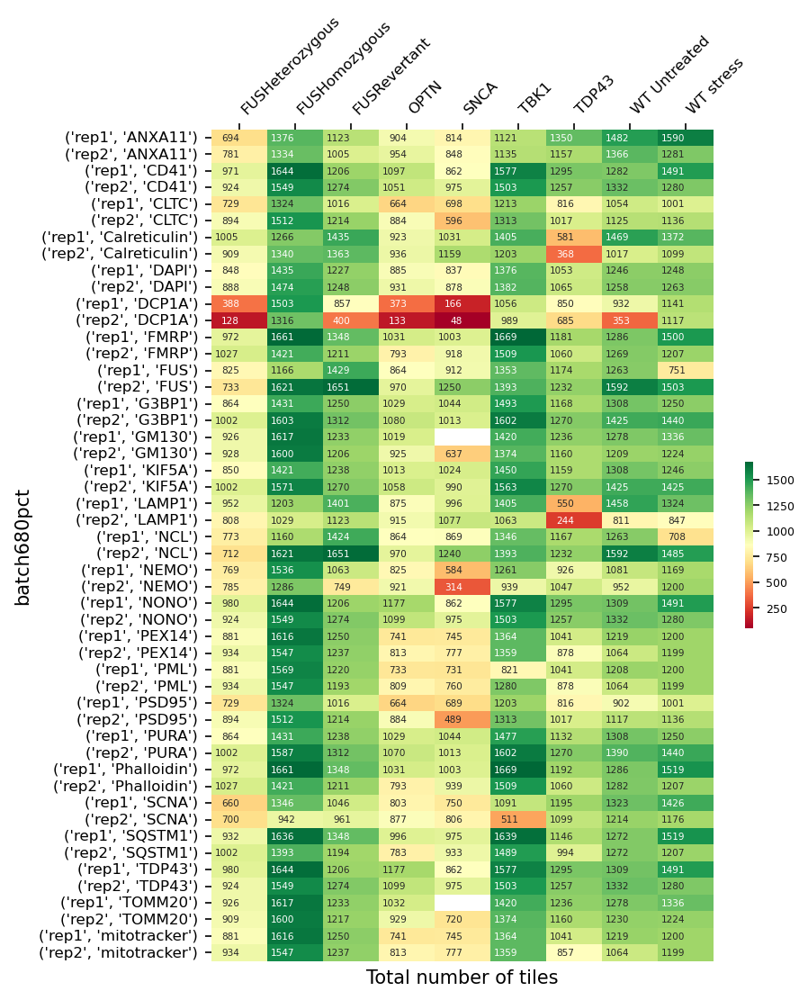

/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


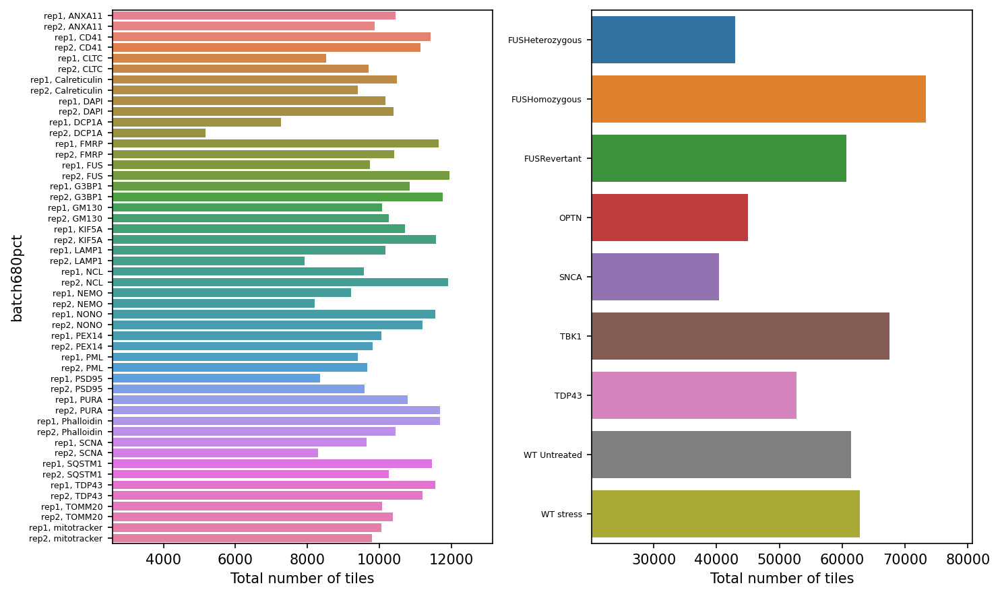

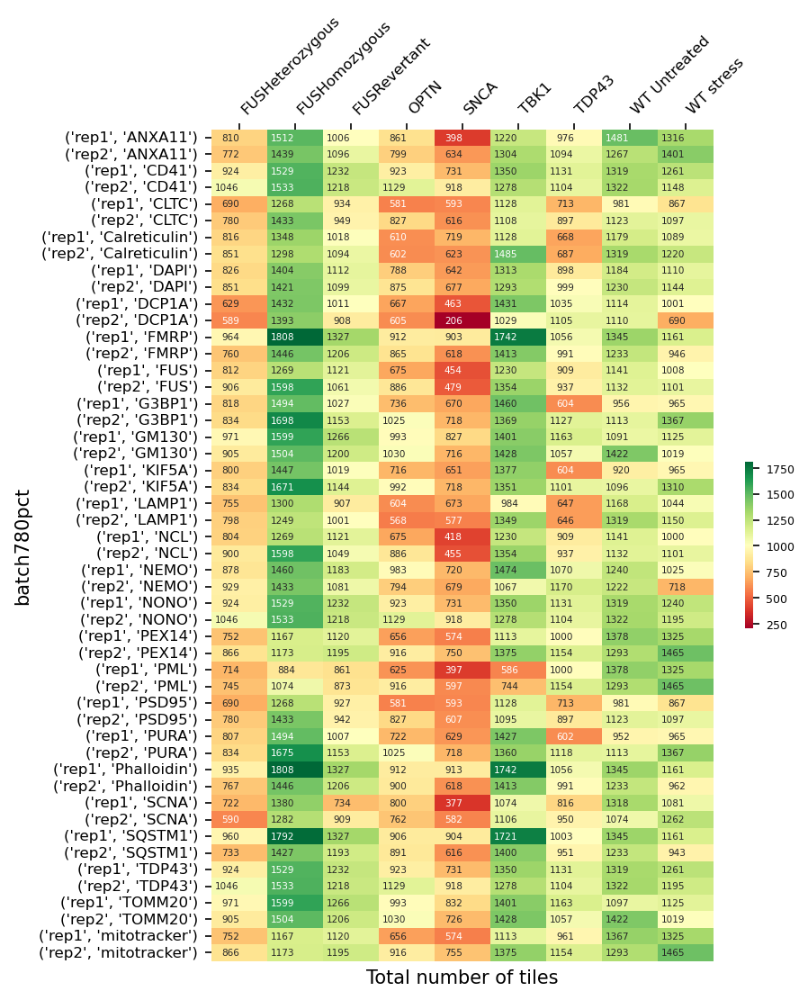

/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


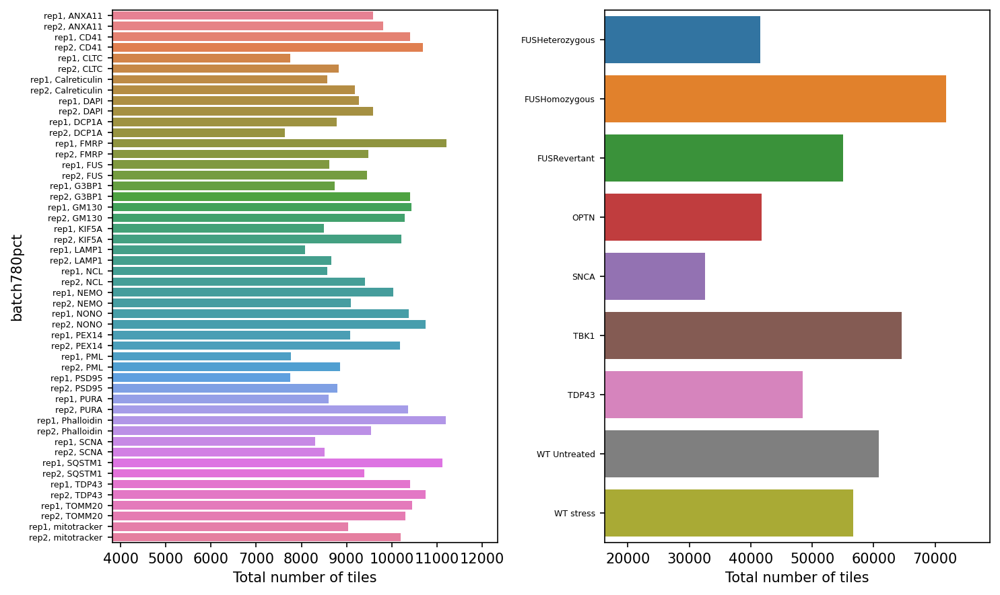

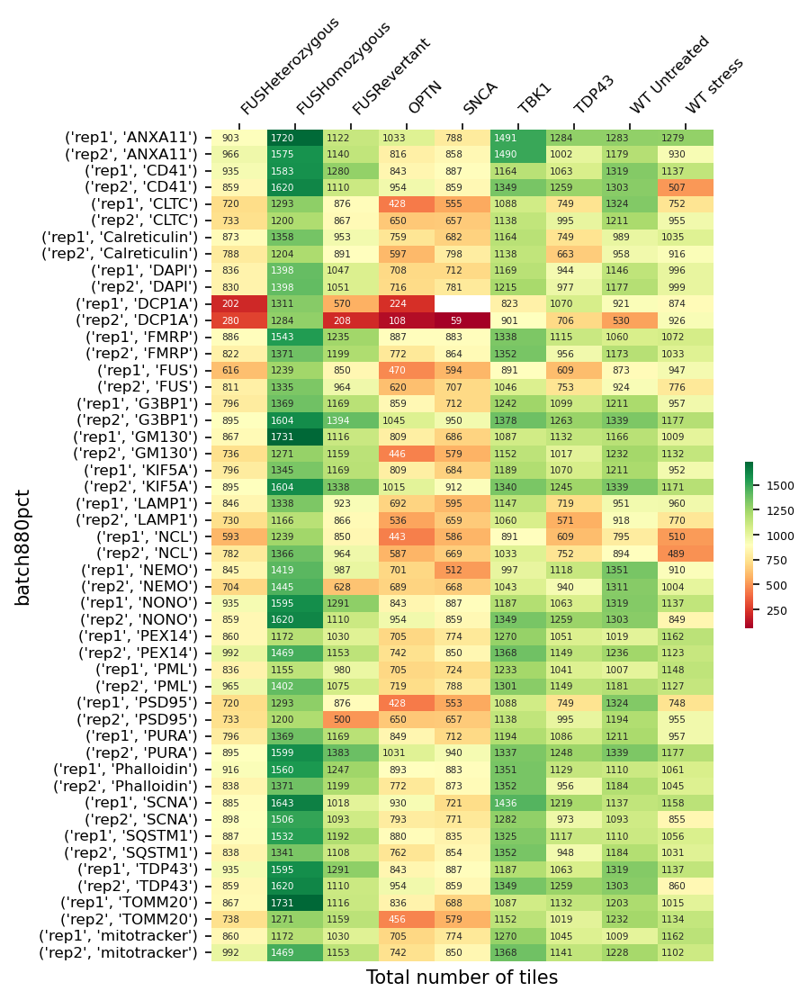

/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


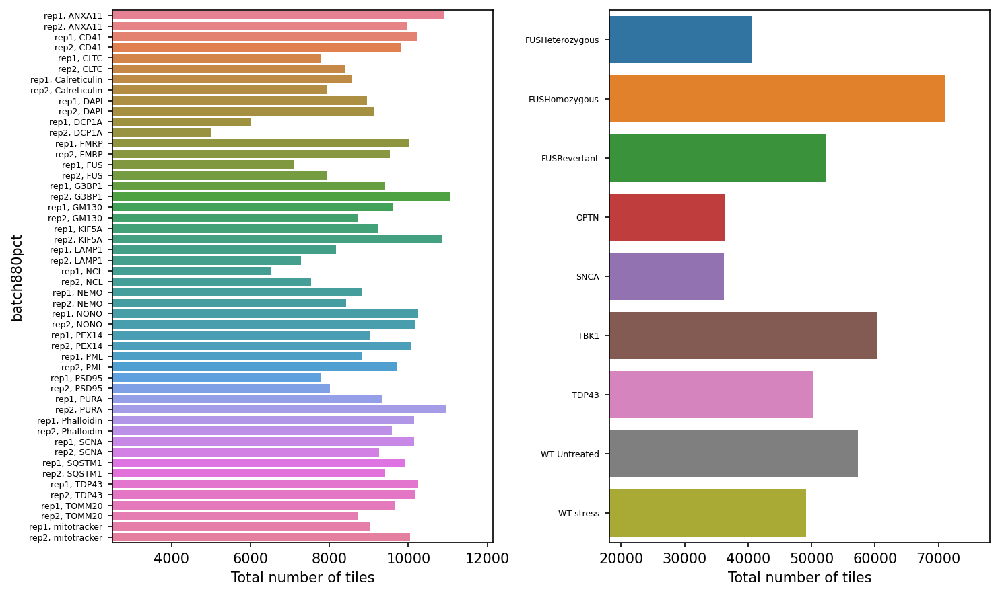

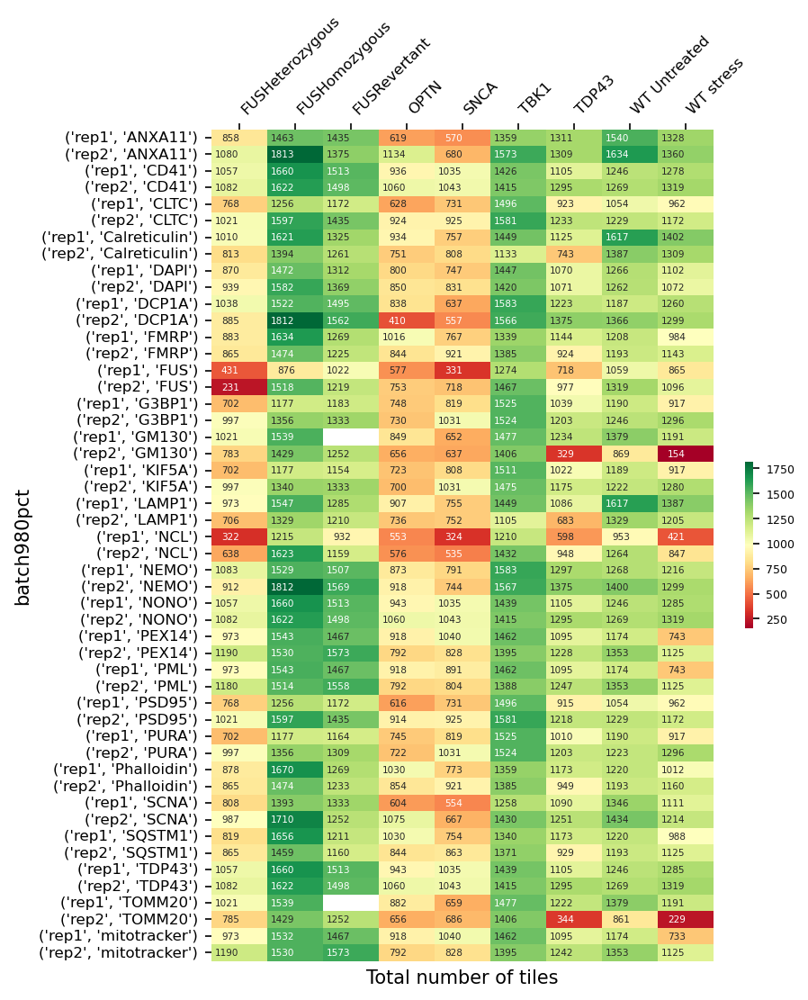

/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


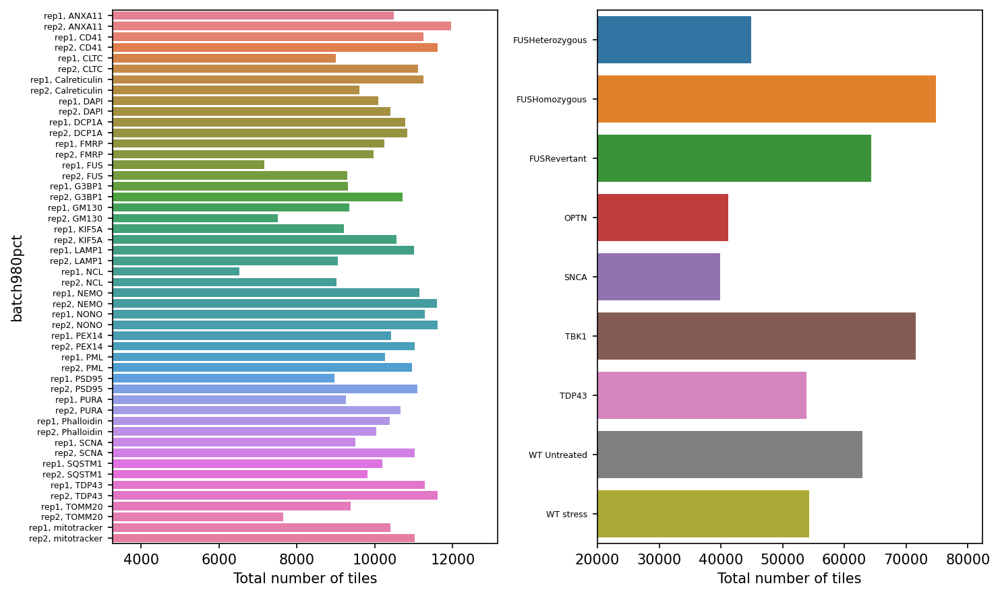

In [49]:
to_heatmap = total_sum.rename(columns={'n_valid_tiles':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of tiles', show_sum=True, figsize=(6,8))

### Show Total Whole Cell Counts
For each batch, cell line, replicate and markerTotal number of tiles

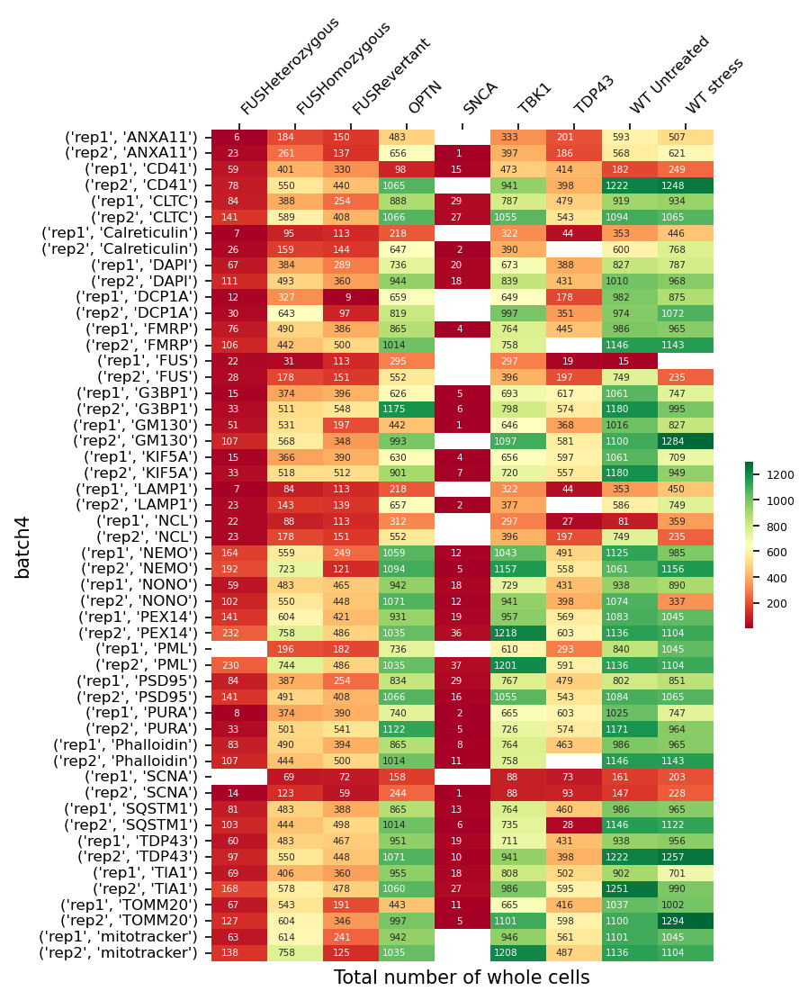

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


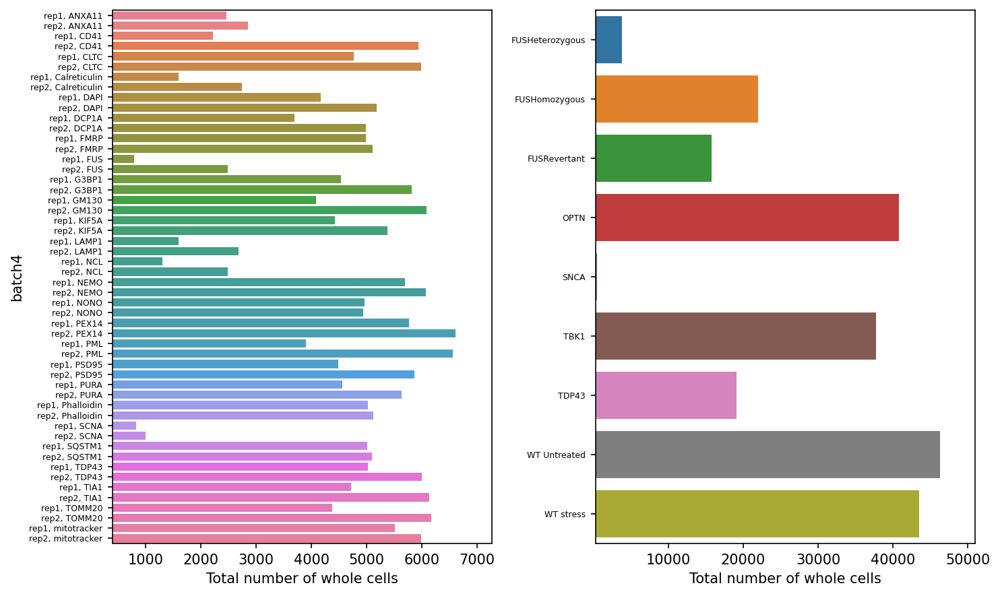

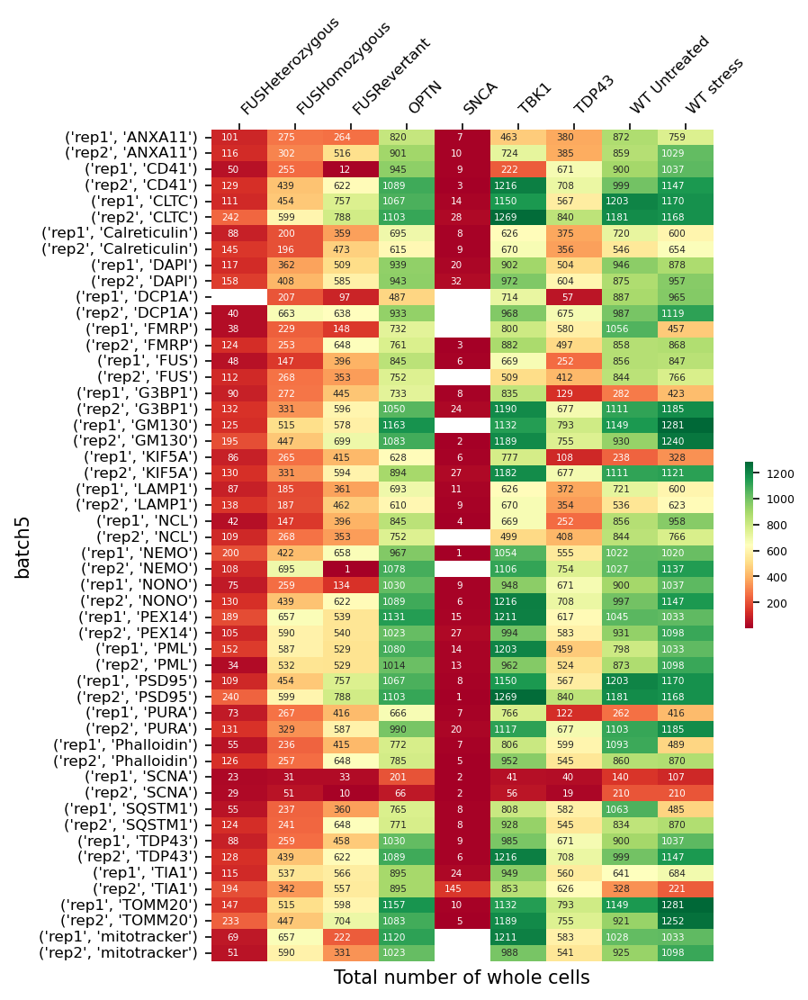

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


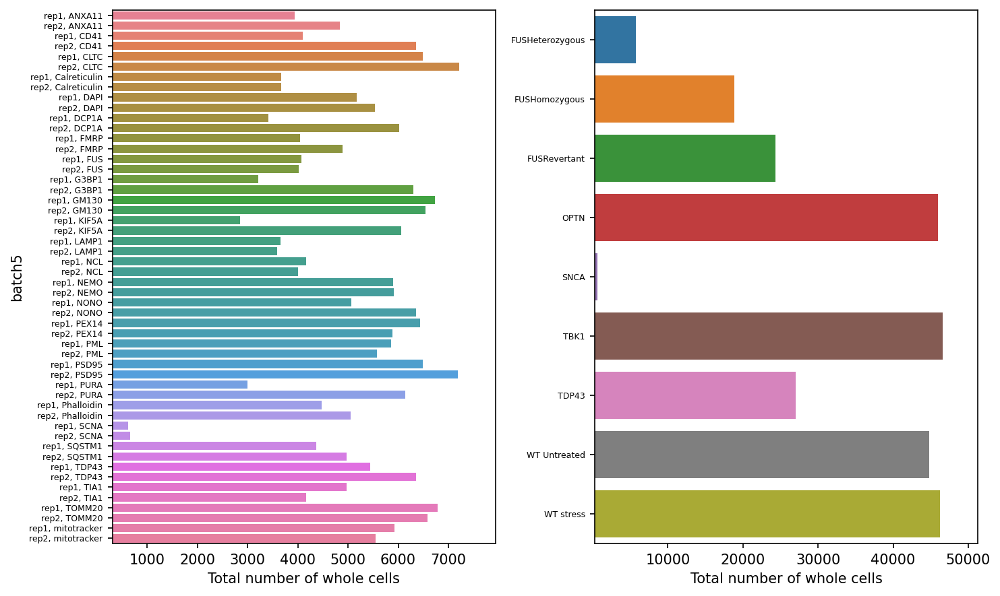

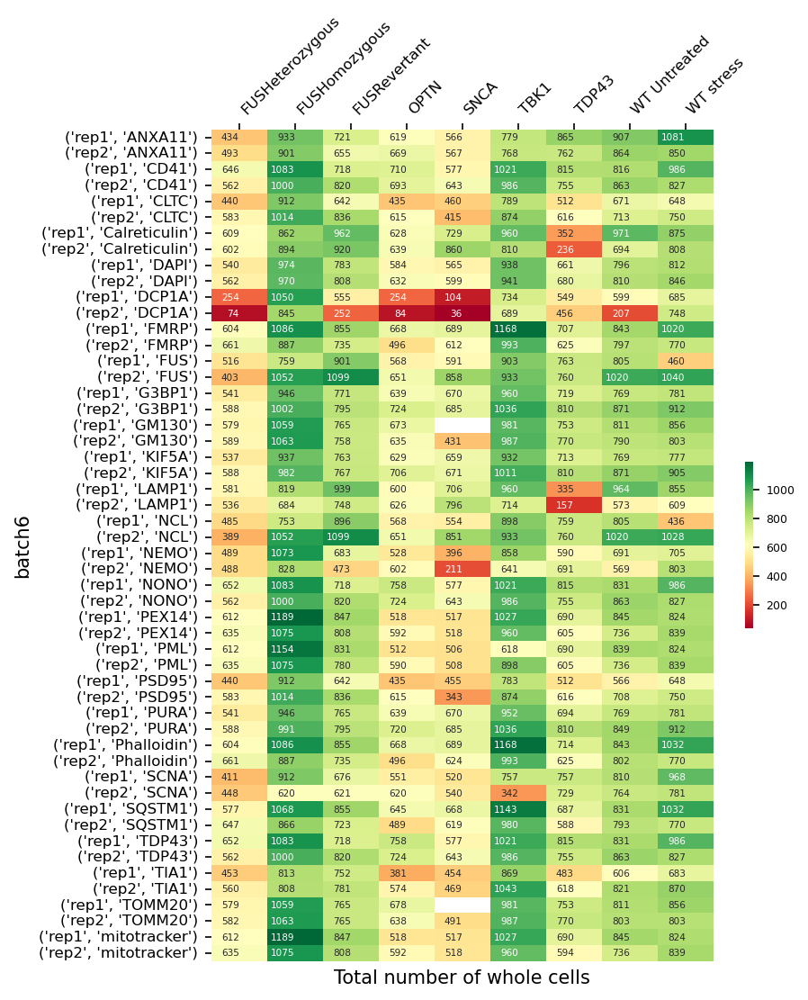

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


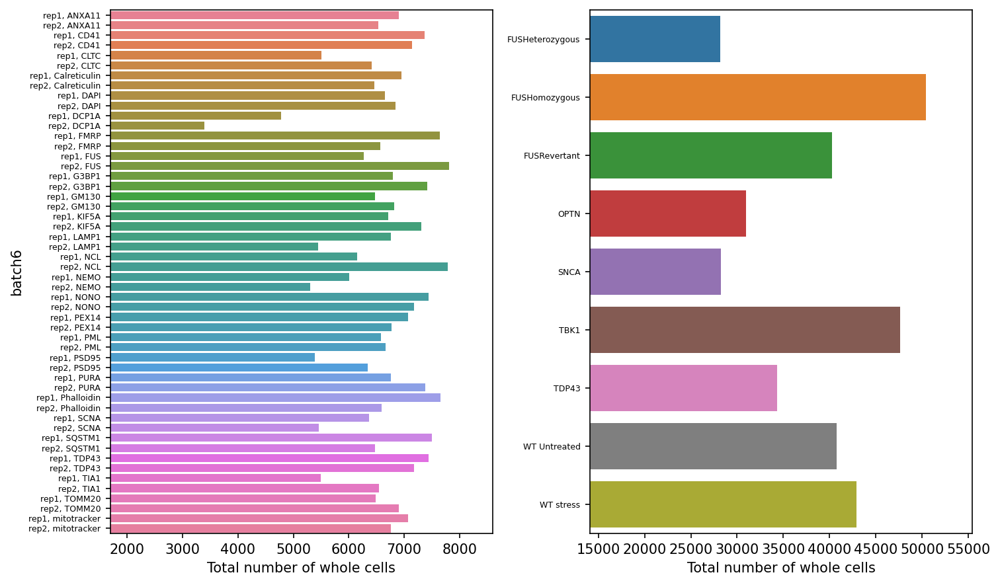

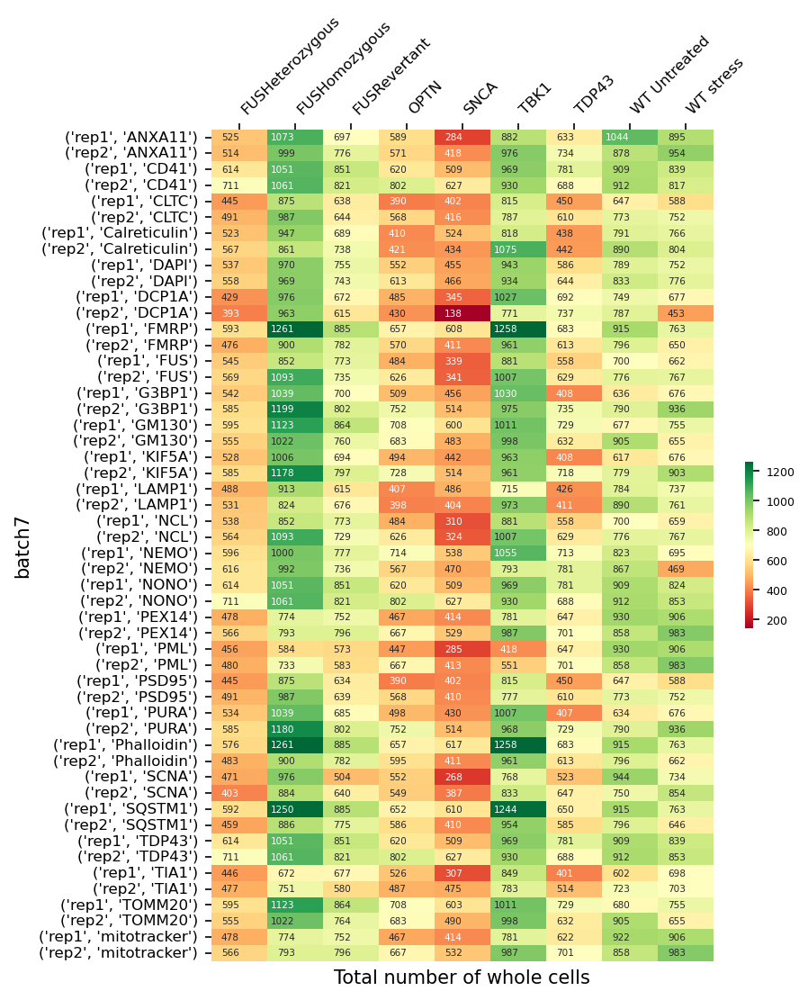

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


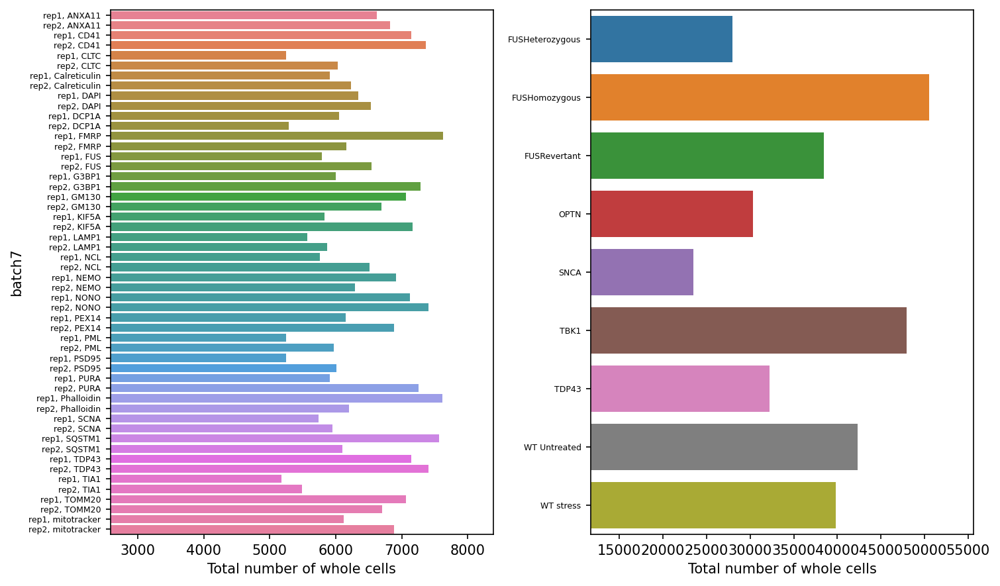

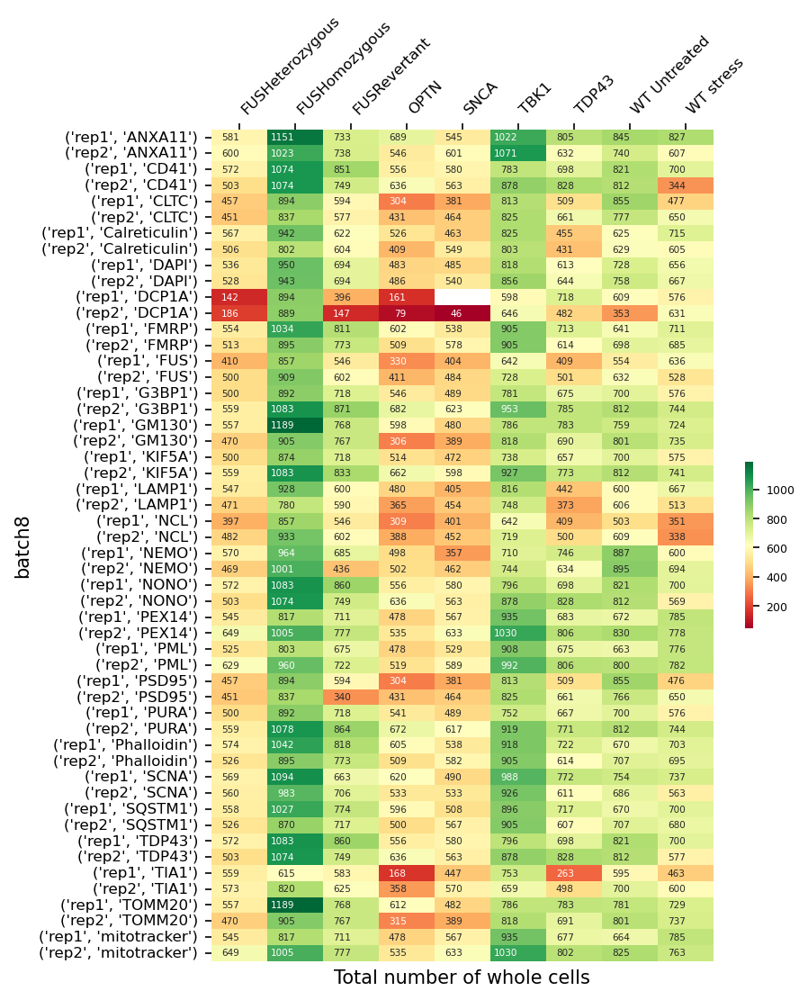

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


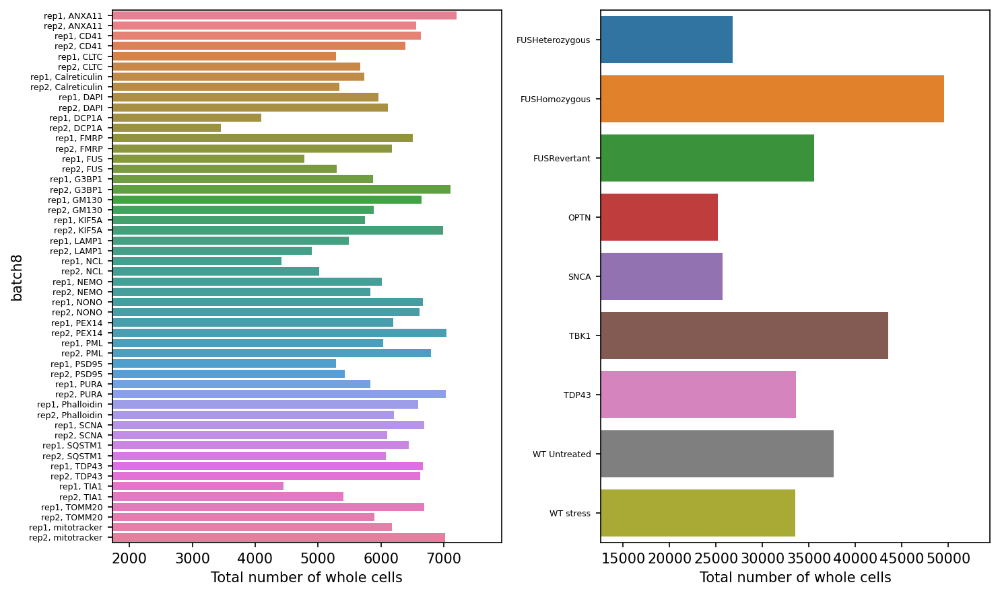

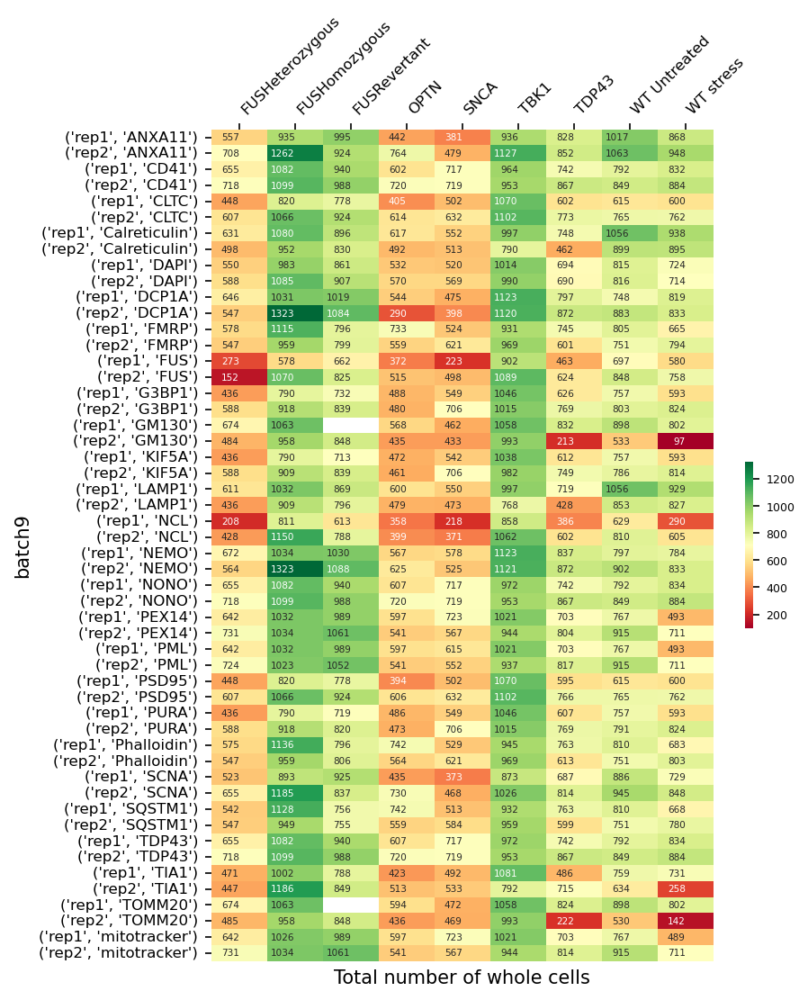

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:381: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


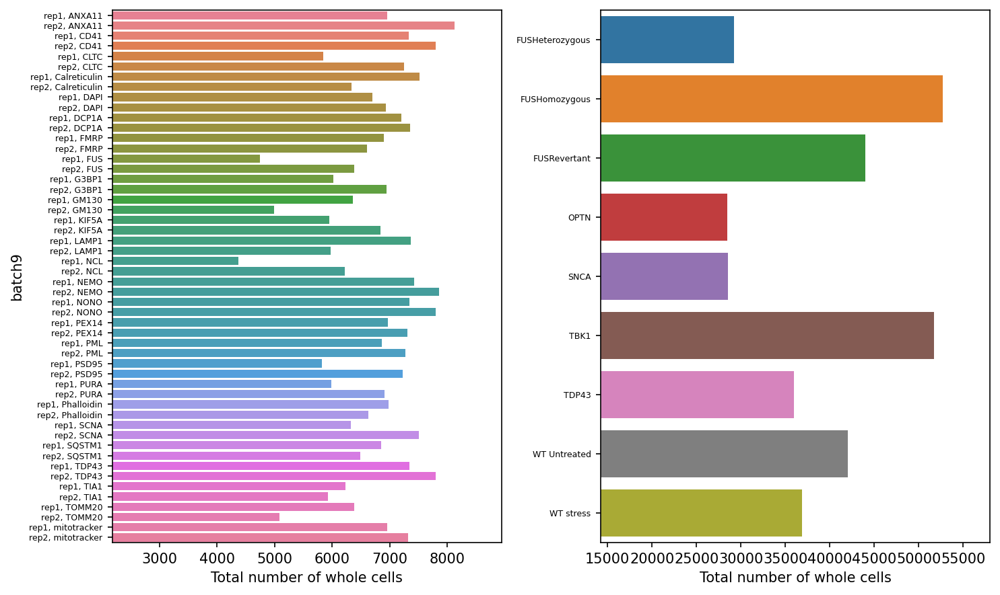

In [36]:
to_heatmap = total_sum.rename(columns={'site_whole_cells_counts_sum':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of whole cells', show_sum=True, figsize=(6,8))

### Show **Cell Count** Statistics per Batch

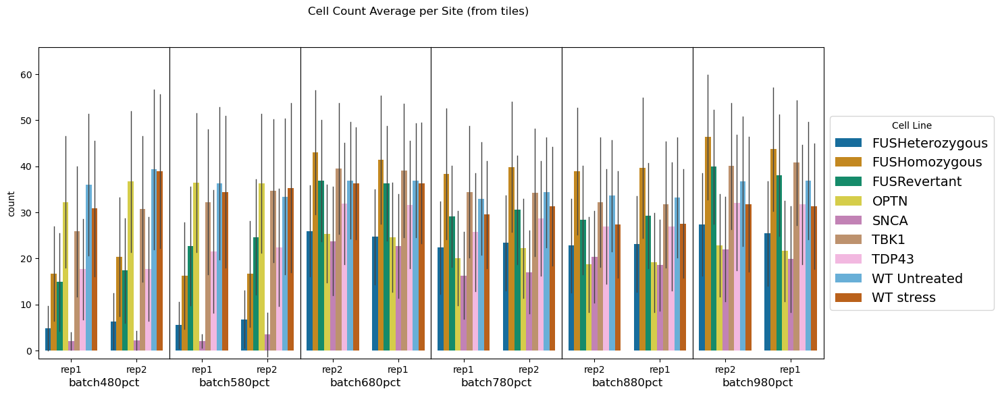

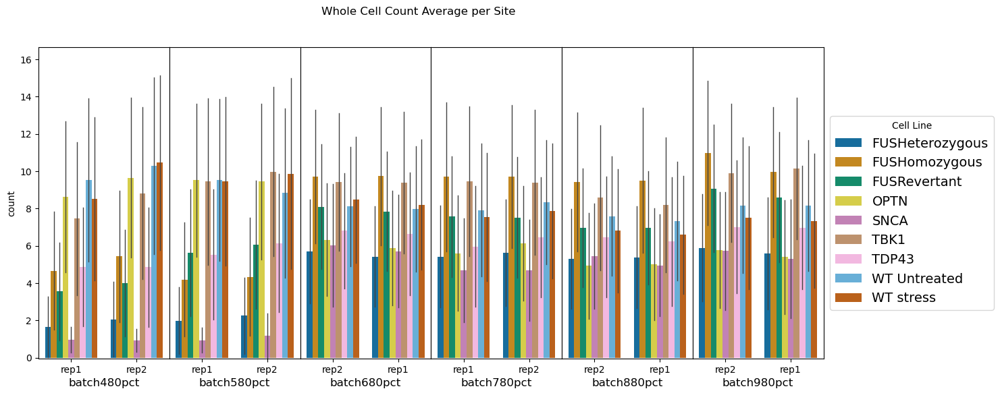

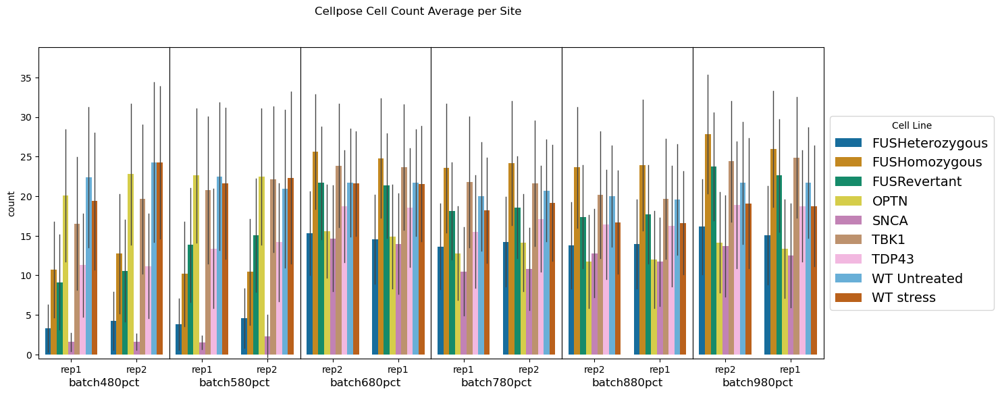

In [50]:
df_no_empty_sites = df_dapi[df_dapi.n_valid_tiles !=0]
plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_cell_count_sum', 
                title='Cell Count Average per Site (from tiles)')

plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_whole_cells_counts_sum',
                title='Whole Cell Count Average per Site')

plot_cell_count(df_no_empty_sites, lines_order, custom_palette, y='site_cell_count',
               title='Cellpose Cell Count Average per Site')


### Show **Tiles** per Site Statistics


In [51]:
df_dapi.groupby(['cell_line_cond']).n_valid_tiles.mean()

cell_line_cond
FUSHeterozygous     6.486467
FUSHomozygous      11.849591
FUSRevertant       10.194944
OPTN                9.759272
SNCA                5.420112
TBK1               12.781094
TDP43               9.261581
WT Untreated       12.513323
WT stress          11.652606
Name: n_valid_tiles, dtype: float64

In [ ]:
df_dapi['batch'] = df_dapi['batch'].str[:-5]

127745    batch4
127742    batch4
127739    batch4
127736    batch4
127733    batch4
           ...  
301941    batch9
301945    batch9
301949    batch9
301953    batch9
301957    batch9
Name: batch, Length: 115871, dtype: object

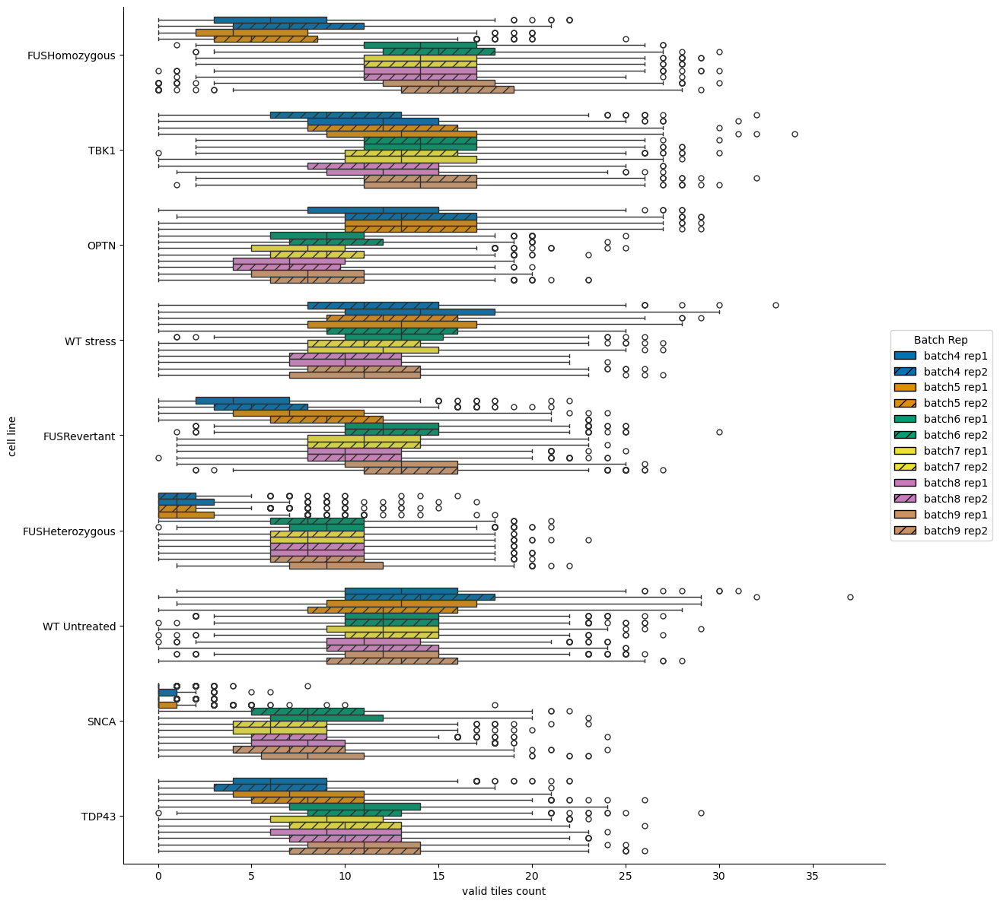

In [58]:
plot_catplot(df_dapi, custom_palette,reps, x='n_valid_tiles', x_title='valid tiles count', batch_min=4, batch_max=9)


### Show Mean of cell count in valid tiles

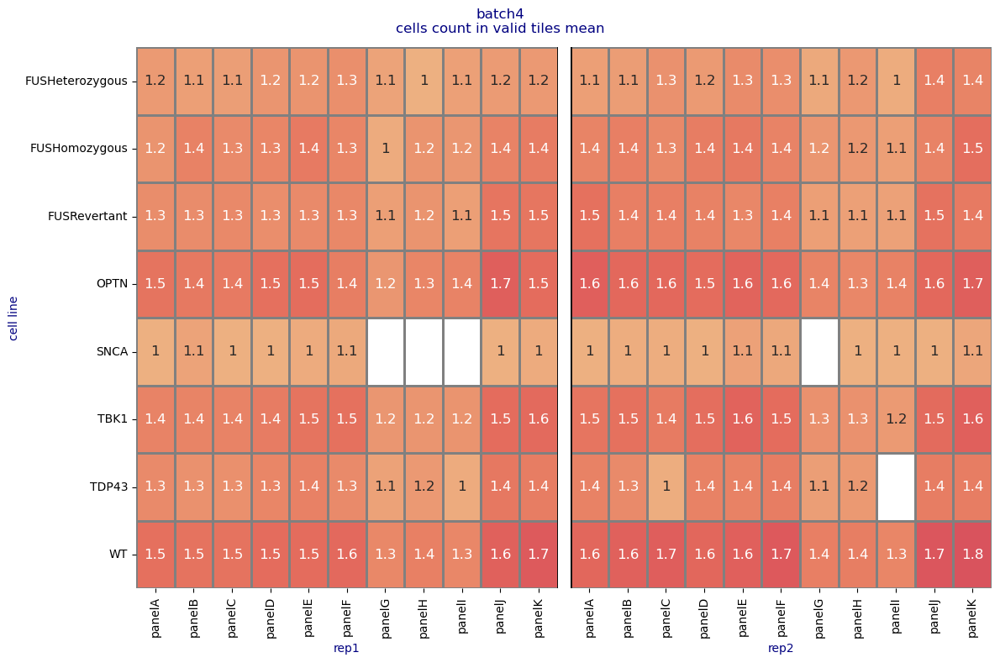

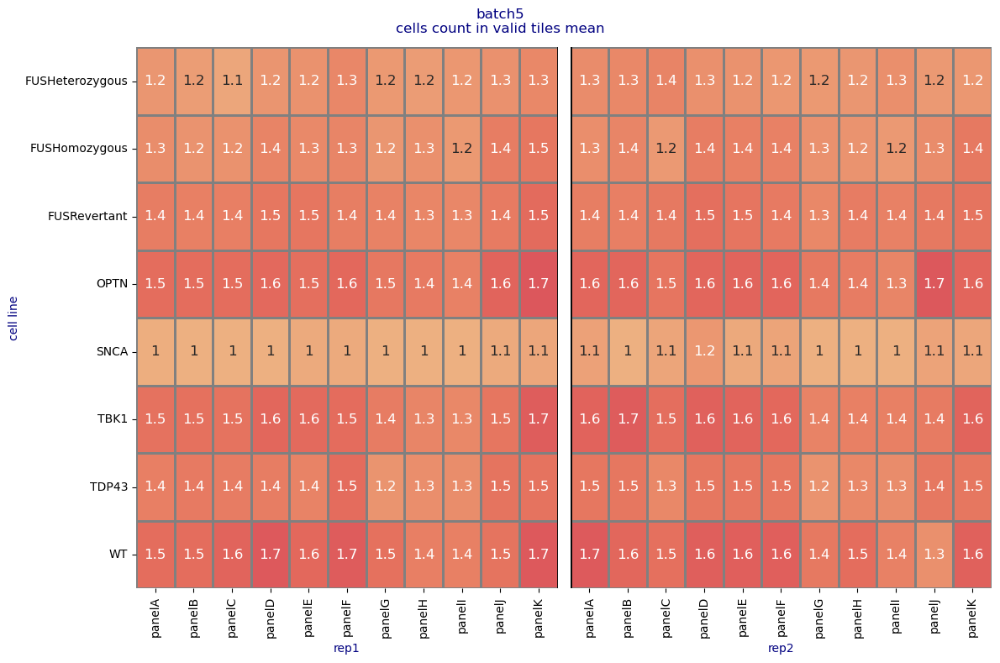

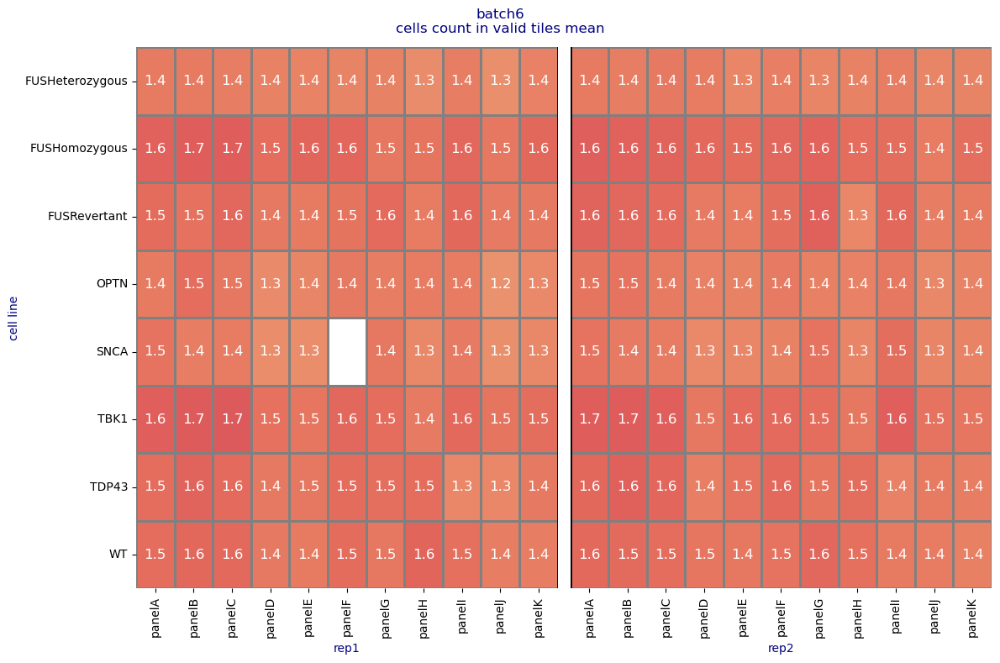

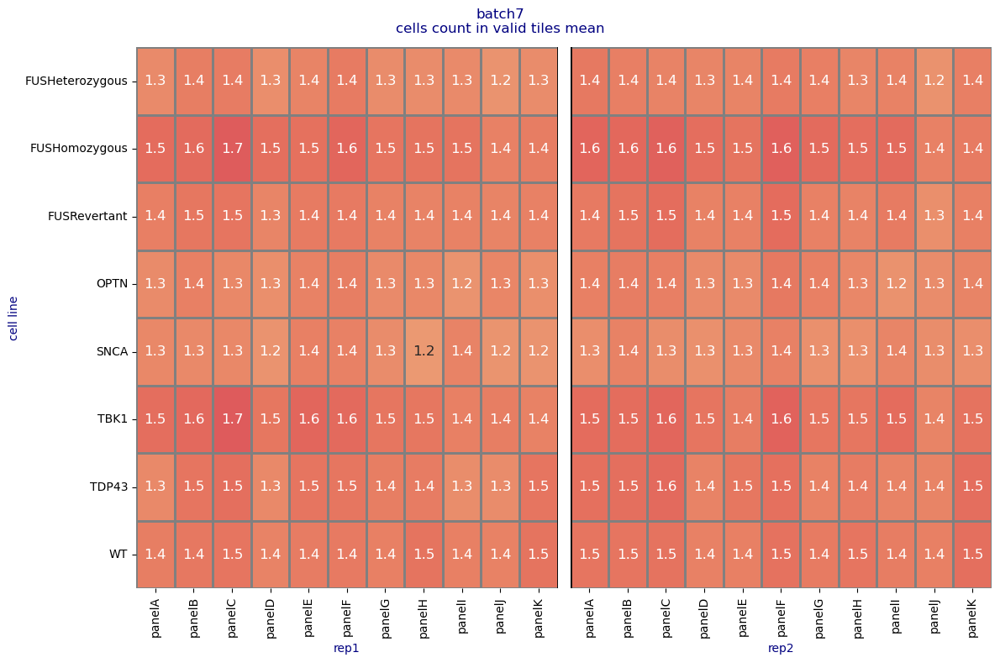

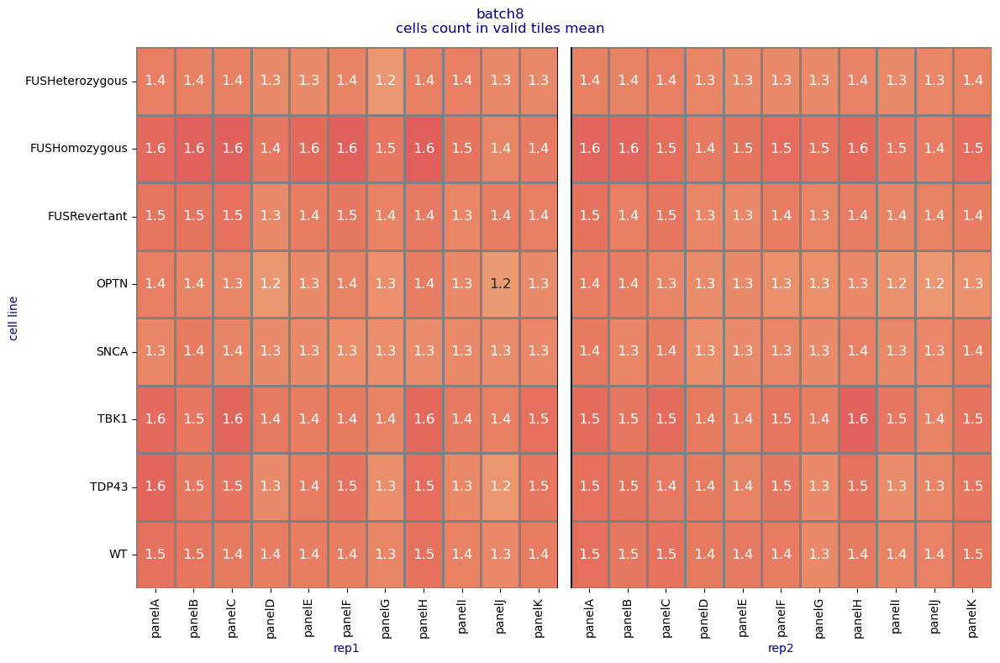

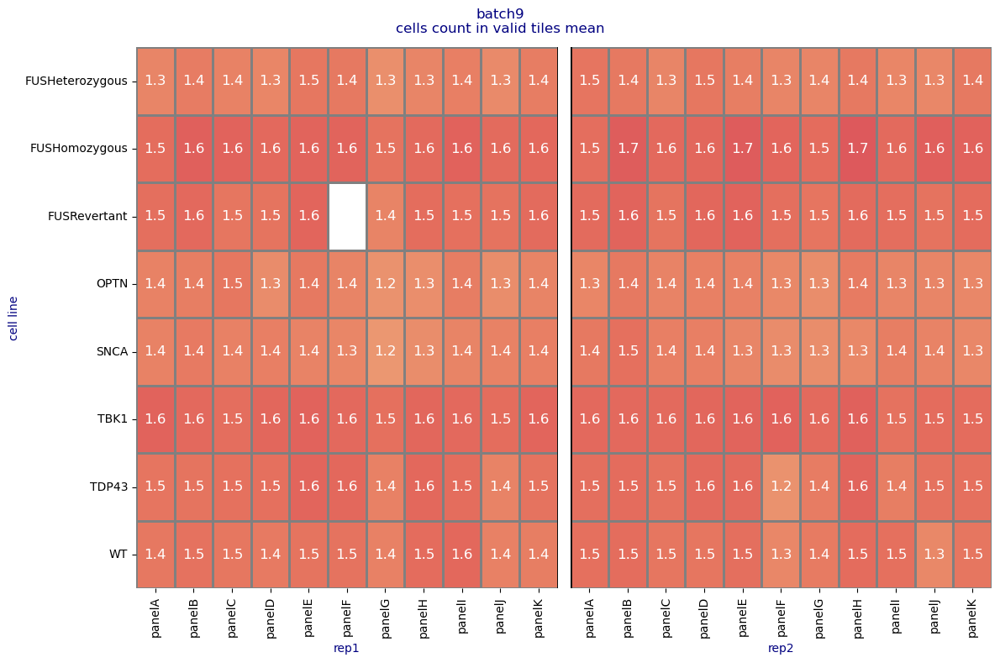

In [59]:
plot_hm(df_dapi, split_by='rep', rows='cell_line', columns='panel', vmax=3)

In [60]:
df_dapi[['cells_count_in_valid_tiles_mean']].mean()

cells_count_in_valid_tiles_mean    1.436252
dtype: float64

In [61]:
df_dapi[['site_cell_count']].mean()

site_cell_count    16.91532
dtype: float64

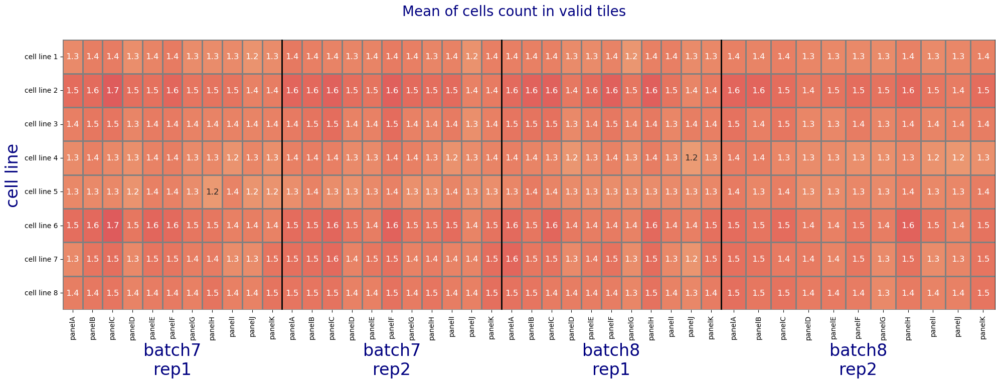

In [62]:
## Only batches 7&8
plot_hm_combine_batches(df_dapi,  batches=['batch7','batch8'], 
                        reps = ['rep1','rep2'],rows='cell_line', columns='panel', vmax=3)


# Assessing Staining Reproducibility and Outliers

In [ ]:
for batch in batches:
    batch = batch.replace('_80pct','')
    print(batch)
    #batch_num = batch.replace('batch',"")
    run_calc_hist_new(batch,cell_lines_for_disp, markers, root_directory_raw, root_directory_proc,
                           hist_sample=10,sample_size_per_markers=200, ncols=7, nrows=4)
    print("="*30)



batch4


In [3]:
# save notebook as HTML ( the HTML will be saved in the same folder the original script is)
display(Javascript('IPython.notebook.save_checkpoint();'))
os.system(f'jupyter nbconvert --to html tools/preprocessing_tools/qc_reports/qc_report_d8_80p.ipynb --output {NOVA_HOME}/manuscript/preprocessing_qc_reports/qc_report_d8_80pct.html')

<IPython.core.display.Javascript object>

[NbConvertApp] Converting notebook tools/preprocessing_tools/qc_reports/qc_report_d8_80p.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 77 image(s).
[NbConvertApp] Writing 19680427 bytes to /home/labs/hornsteinlab/Collaboration/NOVA_Oz/NOVA/manuscript/preprocessing_qc_reports/qc_report_d8_80pct.html


0